In [1]:
import numpy as np
import pandas as pd

import sklearn
from sklearn import metrics

import shap
import statsmodels.api as sm

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours

import lightgbm as lgb

import sys
sys.path.append('../')
import importlib
import os
from joblib import dump, load

import model_util
importlib.reload(model_util)
from model_util import get_estimator_probabilities, get_scoring_metrics

import feature_sets
importlib.reload(feature_sets)

import feature_sets_rnfl
importlib.reload(feature_sets_rnfl)


#from sklearnex import patch_sklearn
#patch_sklearn()

<module 'feature_sets_rnfl' from '/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../feature_sets_rnfl.py'>

In [2]:
!pip cache purge  

Files removed: 0


# Load data

- Use min-max scaled X_train and X_test for all models for consistency, even if not required
- Use miceforest imputed data for all models (same reasoning)

<br>

### tte: 3 years

In [2]:
X_train_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_3year_tte.pkl')
y_train_3year_tte = load('../data/imputed/IOPsubcohort_y_train_3year_tte.pkl')

X_test_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_3year_tte.pkl')
y_test_3year_tte = load('../data/imputed/IOPsubcohort_y_test_3year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_3year_tte = {
    'LR': 'logistic_regression_sgd_3year_tte',
    'SVM': 'svm_3year_tte',
    'KNN': 'knn_3year_tte',
    'RF': 'randomforest_3year_tte',
    'XGBoost': 'xgboost_3year_tte',
    'LightGBM': 'lightgbm_3year_tte',
}

<br>

### tte: matched 3 years

In [2]:
X_train_imputed_scaled_matched3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_matched3year_tte.pkl')
y_train_matched3year_tte = load('../data/imputed/IOPsubcohort_y_train_matched3year_tte.pkl')

X_test_imputed_scaled_matched3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_matched3year_tte.pkl')
y_test_matched3year_tte = load('../data/imputed/IOPsubcohort_y_test_matched3year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_matched3year_tte = {
    'LR': 'logistic_regression_sgd_matched3year_tte',
    'SVM': 'svm_matched3year_tte',
    'KNN': 'knn_matched3year_tte',
    'RF': 'randomforest_matched3year_tte',
    'XGBoost': 'xgboost_matched3year_tte',
    'LightGBM': 'lightgbm_matched3year_tte',
}

<br>

### tte: IOP removed 3 years

In [9]:
X_train_imputed_scaled_IOPremoved3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_IOPremoved3year_tte.pkl')
y_train_IOPremoved3year_tte = load('../data/imputed/IOPsubcohort_y_train_IOPremoved3year_tte.pkl')

X_test_imputed_scaled_IOPremoved3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_IOPremoved3year_tte.pkl')
y_test_IOPremoved3year_tte = load('../data/imputed/IOPsubcohort_y_test_IOPremoved3year_tte.pkl')

In [10]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_IOPremoved3year_tte = {
    'LR': 'logistic_regression_sgd_IOPremoved3year_tte',
    'SVM': 'svm_IOPremoved3year_tte',
    'KNN': 'knn_IOPremoved3year_tte',
    'RF': 'randomforest_IOPremoved3year_tte',
    'XGBoost': 'xgboost_IOPremoved3year_tte',
    'LightGBM': 'lightgbm_IOPremoved3year_tte',
}

<br>

### tte: RNFL 3 years

In [9]:
X_train_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_rnfl3year_tte.pkl')
y_train_3year_tte = load('../data/imputed/IOPsubcohort_y_train_rnfl3year_tte.pkl')

X_test_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_rnfl3year_tte.pkl')
y_test_3year_tte = load('../data/imputed/IOPsubcohort_y_test_rnfl3year_tte.pkl')

In [10]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_3year_tte = {
    'LR': 'logistic_regression_sgd_rnfl3year_tte',
    'SVM': 'svm_rnfl3year_tte',
    'KNN': 'knn_rnfl3year_tte',
    'RF': 'randomforest_rnfl3year_tte',
    'XGBoost': 'xgboost_rnfl3year_tte',
    'LightGBM': 'lightgbm_rnfl3year_tte',
}

<br>

### tte: No IOP RNFL 3 years

In [2]:
X_train_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_noIOPrnfl3year_tte.pkl')
y_train_3year_tte = load('../data/imputed/IOPsubcohort_y_train_noIOPrnfl3year_tte.pkl')

X_test_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_noIOPrnfl3year_tte.pkl')
y_test_3year_tte = load('../data/imputed/IOPsubcohort_y_test_noIOPrnfl3year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_3year_tte = {
    'LR': 'logistic_regression_sgd_noIOPrnfl3year_tte',
    'SVM': 'svm_noIOPrnfl3year_tte',
    'KNN': 'knn_noIOPrnfl3year_tte',
    'RF': 'randomforest_noIOPrnfl3year_tte',
    'XGBoost': 'xgboost_noIOPrnfl3year_tte',
    'LightGBM': 'lightgbm_noIOPrnfl3year_tte',
}

<br>

<br>

# Model accuracy

- Compare algorithms per feature set
- Compare best-performing algorithms across feature sets

### Function defs

In [4]:
def compare_estimator_auroc_bar(estimator_dict, y, best_model, ax):
    #ax.set_xlabel('Model')
    #ax.set_ylabel('Area under the receiver operating characteristic curve (AUROC)')

    x_arr = np.array([])
    y_arr = np.array([])

    errorbar_low_arr = np.array([])
    errorbar_high_arr = np.array([])

    ax.axhline(color='k', linestyle='dotted', y=0.5, xmin=0.05, xmax=0.95, label=f'Baseline: 0.5', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        auroc_CI_low = vals['auroc_CI_low']
        auroc_CI_high = vals['auroc_CI_high']

        x_arr = np.append(x_arr, model_name)
        y_arr = np.append(y_arr, auroc)
        errorbar_low_arr = np.append(errorbar_low_arr, auroc - auroc_CI_low)
        errorbar_high_arr = np.append(errorbar_high_arr, auroc_CI_high - auroc)

    sns.barplot(x=x_arr, y=y_arr, hue=x_arr, ax=ax, legend=False)
    
    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        #ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)
        if display_name == best_model:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8, fontweight='bold')
        else:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)

    for label in ax.get_xticklabels():
        if label.get_text() == estimator_dict[best_model]['model_name']:
            label.set_fontweight('bold')
    
    #ax.bar_label(ax.containers[0], padding=40, fmt='%.3f')
    #ax.bar_label(ax.containers[0], padding=0, fmt='%.3f', label_type='center', fontsize=8)

    #for bar in ax.containers[0]:
    #     plt.text(bar.get_x(), 0.95, f'{bar.get_height():0.3f}')
    
    ax.errorbar(
        x=x_arr, y=y_arr,
        yerr = [errorbar_low_arr, errorbar_high_arr],
        fmt='none',
        ecolor='k',
        elinewidth=1,
        capsize=6,
    )

    ax.set_ylim([0, 1])
    ax.set_yticks(np.linspace(0, 1, 11))


    
    #if save_dir:
    #    plt.savefig(f'{save_dir}/bar_auroc.png', dpi=600, bbox_inches='tight', pad_inches=0)

    #plt.show()

# V2

def compare_estimator_roc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    ax.plot([0, 1], [0, 1], 'k:', label='Baseline: 0.500', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        fpr_arr, tpr_arr, trial_t_arr = metrics.roc_curve(y, probabilities, pos_label=1, drop_intermediate=False)
        scoring_metrics = get_scoring_metrics(estimator, X, y)
        roc_auc = scoring_metrics['roc_auc']
        ax.plot(fpr_arr, tpr_arr, label=label, alpha=1)


    #ax.legend(loc='lower right')

    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

# V2

def compare_estimator_prc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    # Baseline = glaucoma prevalence
    n_pos = (y == 1).sum()
    n_total = len(y)
    baseline_y = n_pos / n_total
    ax.hlines(colors='k', linestyles='dotted', y=baseline_y, xmin=0, xmax=1, label=f'Baseline: {baseline_y:0.3f}', alpha=0.7)
   
    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        precision, recall, pr_t = metrics.precision_recall_curve(y, probabilities, pos_label=1, drop_intermediate=True)
        pr_auc = metrics.auc(recall, precision)
        ax.plot(recall, precision, label=label, alpha=1)

 
    #ax.legend(loc='upper right', fontsize=8)


    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

### Compare algorithms for each feature set

In [12]:
compare_feature_set_dict = model_feature_dict = {
    'ophthalmic': feature_sets.ophthalmic_features['feature'].values,
    'demographic': feature_sets.demographic_features['feature'].values,
    'systemic': feature_sets.systemic_features['feature'].values,
    'lifestyle': feature_sets.lifestyle_features['feature'].values,

    'OD': feature_sets.OD_features['feature'].values,
    'SL': feature_sets.SL_features['feature'].values,
    'ODSL': feature_sets.ODSL_features['feature'].values,
    #'ODS': feature_sets.ODS_features['feature'].values,
    'DSL': feature_sets.DSL_features['feature'].values, # Primary-care focused       

    #'minimal_features_rfecv_3year_tte': feature_sets.minimal_features_rfecv_3year_tte['feature'].values
}

<br>

### rnfl model

In [16]:
compare_feature_set_dict = model_feature_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values,
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values,
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values,
    #'ODS': feature_sets_rnfl.ODS_features['feature'].values,
    'DSL': feature_sets_rnfl.DSL_features['feature'].values, # Primary-care focused       

    #'minimal_features_rfecv_3year_tte': feature_sets_rnfl.minimal_features_rfecv_3year_tte['feature'].values
}

<br>

### no IOP RNFL model

In [5]:
model_feature_dict = compare_feature_set_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values[~np.isin(feature_sets_rnfl.ophthalmic_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values[~np.isin(feature_sets_rnfl.OD_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values[~np.isin(feature_sets_rnfl.ODSL_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'DSL': feature_sets_rnfl.DSL_features['feature'].values}


<br>

<br>

<br>

## Get best model: 3 year 

In [13]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_3year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_3year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_3year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_3year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_3year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_3year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_3year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_3year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_3year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_3year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7fdd1eaff7e0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

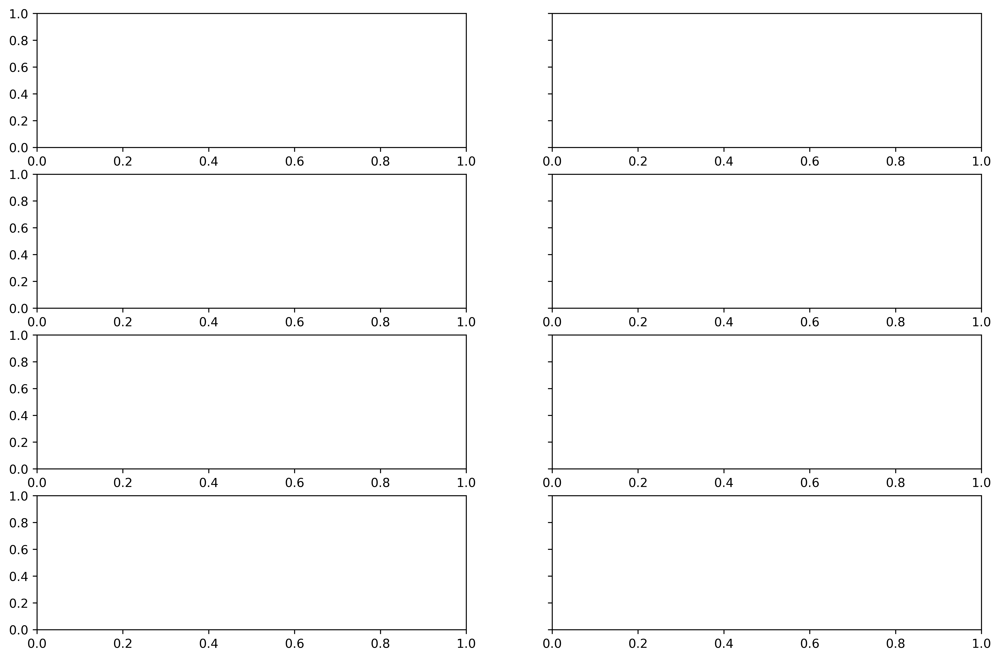

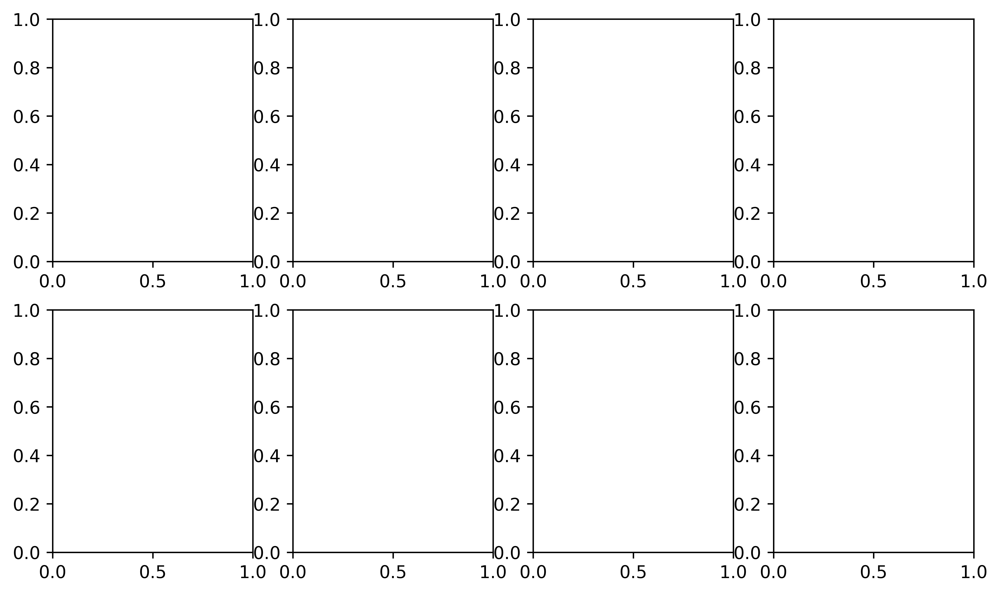

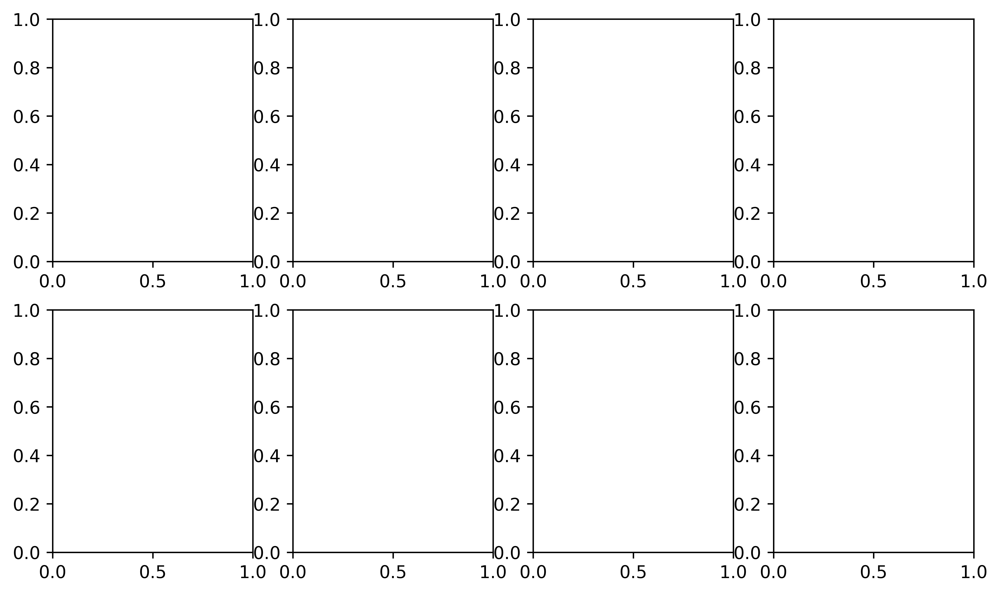

In [17]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)


auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_3year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_3year_tte,
        #y_test_3year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_3year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_3year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## Get best model: matched 3 year

In [13]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)
    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_matched3year_tte[feature_set]
        

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_matched3year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_matched3year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_matched3year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_matched3year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_matched3year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_matched3year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_matched3year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_matched3year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_matched3year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

SyntaxError: f-string: unmatched '[' (1082879930.py, line 17)

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 1.748539019441911e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.817532,0.818 (0.747 - 0.881),0.708 (0.574 - 0.836),0.797 (0.760 - 0.832),0.262 (0.188 - 0.339),0.964 (0.945 - 0.982),0.382 (0.289 - 0.471),0.407 (0.271 - 0.569)
SVM,svm_matched3year_tte,C: 0.0017030567153239185 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.803716,0.804 (0.731 - 0.870),0.750 (0.622 - 0.867),0.797 (0.759 - 0.833),0.273 (0.199 - 0.352),0.969 (0.951 - 0.985),0.400 (0.307 - 0.488),0.408 (0.270 - 0.570)
KNN,knn_matched3year_tte,n_neighbors: 151 weights: distance metric: cosine algorithm: brute,0.768141,0.768 (0.682 - 0.848),0.625 (0.488 - 0.761),0.867 (0.835 - 0.896),0.323 (0.228 - 0.419),0.958 (0.938 - 0.976),0.426 (0.317 - 0.523),0.396 (0.252 - 0.548)
RF,randomforest_matched3year_tte,n_estimators: 94 max_depth: 23 max_features: 0.6672843080285227 min_samples_leaf: 35 max_samples: 0.5794705267222914 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.772224,0.772 (0.686 - 0.851),0.667 (0.528 - 0.800),0.809 (0.773 - 0.844),0.262 (0.185 - 0.342),0.960 (0.940 - 0.978),0.376 (0.280 - 0.465),0.373 (0.243 - 0.537)
XGBoost,xgboost_matched3year_tte,n_estimators: 440 learning_rate: 0.012178993518058113 max_depth: 3 subsample: 0.5324966294106109 colsample_bytree: 0.6257494392425963 gamma: 0.31522241135033363 lambda: 0.002179606652105661 min_child_weight: 0.831115649629982 max_bin: 890 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.770392,0.770 (0.687 - 0.848),0.625 (0.481 - 0.761),0.867 (0.835 - 0.896),0.323 (0.229 - 0.419),0.958 (0.937 - 0.976),0.426 (0.319 - 0.523),0.399 (0.256 - 0.552)
LightGBM,lightgbm_matched3year_tte,n_estimators: 441 max_bin: 626 learning_rate: 0.0015591682828458601 max_depth: 10 num_leaves: 40 bagging_fraction: 0.6874384897633093 feature_fraction: 0.6461693931717558 lambda_l2: 0.023728320075167297 min_sum_hessian_in_leaf: 0.0005424319564434948 min_data_in_leaf: 51 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.778337,0.778 (0.697 - 0.854),0.646 (0.508 - 0.780),0.833 (0.798 - 0.865),0.282 (0.200 - 0.367),0.959 (0.938 - 0.977),0.392 (0.293 - 0.486),0.375 (0.245 - 0.536)


hi bottom
demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.00012030176466585429 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.743423,0.743 (0.663 - 0.819),0.604 (0.465 - 0.743),0.803 (0.767 - 0.840),0.238 (0.164 - 0.315),0.952 (0.931 - 0.972),0.341 (0.247 - 0.429),0.284 (0.173 - 0.418)
SVM,svm_matched3year_tte,C: 4.789395029957428e-06 kernel: poly gamma: 2.6416783062229796e-06 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.708819,0.709 (0.631 - 0.782),0.708 (0.575 - 0.833),0.642 (0.599 - 0.685),0.167 (0.118 - 0.221),0.956 (0.932 - 0.977),0.271 (0.199 - 0.342),0.249 (0.144 - 0.376)
KNN,knn_matched3year_tte,n_neighbors: 487 weights: distance metric: manhattan algorithm: brute,0.719853,0.720 (0.644 - 0.791),0.646 (0.500 - 0.780),0.701 (0.660 - 0.742),0.180 (0.125 - 0.239),0.951 (0.927 - 0.973),0.282 (0.203 - 0.358),0.233 (0.141 - 0.352)
RF,randomforest_matched3year_tte,n_estimators: 434 max_depth: 50 max_features: 0.4361938483372131 min_samples_leaf: 21 max_samples: 0.6071194555790991 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.719412,0.719 (0.633 - 0.799),0.708 (0.574 - 0.833),0.663 (0.619 - 0.705),0.176 (0.124 - 0.231),0.957 (0.934 - 0.978),0.282 (0.207 - 0.355),0.262 (0.159 - 0.391)
XGBoost,xgboost_matched3year_tte,n_estimators: 470 learning_rate: 0.0016972242696068902 max_depth: 3 subsample: 0.5496455587040449 colsample_bytree: 0.8111825866094658 gamma: 0.0005436577786333652 lambda: 0.0012864820379696966 min_child_weight: 0.005445135833566469 max_bin: 259 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.723605,0.724 (0.642 - 0.798),0.625 (0.486 - 0.760),0.754 (0.715 - 0.793),0.205 (0.142 - 0.271),0.952 (0.929 - 0.972),0.309 (0.224 - 0.390),0.247 (0.150 - 0.368)
LightGBM,lightgbm_matched3year_tte,n_estimators: 155 max_bin: 1007 learning_rate: 0.056066880524778005 max_depth: 12 num_leaves: 83 bagging_fraction: 0.997731896029289 feature_fraction: 0.8552746478633401 lambda_l2: 151.50855428264018 min_sum_hessian_in_leaf: 4.438996814810294 min_data_in_leaf: 91 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.743159,0.743 (0.666 - 0.815),0.708 (0.575 - 0.830),0.686 (0.644 - 0.727),0.187 (0.131 - 0.245),0.959 (0.936 - 0.979),0.296 (0.216 - 0.372),0.278 (0.167 - 0.407)


hi bottom
systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.0010804129462761956 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.599135,0.599 (0.514 - 0.684),0.688 (0.551 - 0.816),0.525 (0.480 - 0.571),0.128 (0.090 - 0.170),0.943 (0.913 - 0.969),0.216 (0.156 - 0.277),0.120 (0.081 - 0.170)
SVM,svm_matched3year_tte,C: 0.00016428779351699115 kernel: rbf gamma: 3.1191187493209145 random_state: 2024 cache_size: 7000 max_iter: 1000,0.553275,0.553 (0.466 - 0.638),0.771 (0.647 - 0.884),0.379 (0.336 - 0.423),0.112 (0.080 - 0.146),0.942 (0.907 - 0.973),0.196 (0.143 - 0.249),0.106 (0.072 - 0.152)
KNN,knn_matched3year_tte,n_neighbors: 117 weights: uniform metric: euclidean algorithm: brute,0.540894,0.541 (0.465 - 0.616),0.896 (0.800 - 0.976),0.201 (0.165 - 0.238),0.102 (0.075 - 0.132),0.950 (0.903 - 0.989),0.184 (0.137 - 0.230),0.093 (0.065 - 0.126)
RF,randomforest_matched3year_tte,n_estimators: 429 max_depth: 14 max_features: 0.03626111822817589 min_samples_leaf: 37 max_samples: 0.7736173218245237 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.577507,0.578 (0.498 - 0.658),0.750 (0.625 - 0.868),0.403 (0.358 - 0.447),0.113 (0.080 - 0.149),0.941 (0.907 - 0.971),0.197 (0.142 - 0.252),0.137 (0.084 - 0.238)
XGBoost,xgboost_matched3year_tte,n_estimators: 398 learning_rate: 0.00243450986558366 max_depth: 7 subsample: 0.6549916638209407 colsample_bytree: 0.9411898735833553 gamma: 0.0339752367895771 lambda: 0.1643458497694992 min_child_weight: 0.00013986425593437527 max_bin: 918 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.583598,0.584 (0.502 - 0.665),0.771 (0.645 - 0.882),0.400 (0.357 - 0.445),0.116 (0.082 - 0.152),0.945 (0.911 - 0.974),0.201 (0.147 - 0.256),0.115 (0.078 - 0.170)
LightGBM,lightgbm_matched3year_tte,n_estimators: 414 max_bin: 602 learning_rate: 0.0033263462815259805 max_depth: 12 num_leaves: 87 bagging_fraction: 0.6234629843464029 feature_fraction: 0.5032754902897477 lambda_l2: 0.1372929223635381 min_sum_hessian_in_leaf: 0.12663466104849155 min_data_in_leaf: 120 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.542726,0.543 (0.466 - 0.619),0.750 (0.625 - 0.868),0.392 (0.348 - 0.435),0.111 (0.078 - 0.147),0.939 (0.905 - 0.970),0.194 (0.140 - 0.248),0.100 (0.069 - 0.147)


hi bottom
lifestyle
LR
SVM


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../model_util.py:125: RuntimeWarning: invalid valu

KNN
RF
XGBoost
LightGBM
Best model: KNN (knn_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.0014085773476051585 learning_rate: constant eta0: 0.05281309911649011 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.474179,0.474 (0.395 - 0.552),0.979 (0.930 - 1.000),0.097 (0.071 - 0.126),0.099 (0.073 - 0.127),0.979 (0.930 - 1.000),0.180 (0.136 - 0.225),0.082 (0.058 - 0.111)
SVM,svm_matched3year_tte,C: 0.5883634716726566 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.417329,0.417 (0.334 - 0.505),0.146 (0.054 - 0.250),0.913 (0.887 - 0.937),0.146 (0.054 - 0.250),0.913 (0.887 - 0.937),0.146 (nan - nan),0.084 (0.056 - 0.126)
KNN,knn_matched3year_tte,n_neighbors: 389 weights: uniform metric: manhattan algorithm: brute,0.486825,0.487 (0.401 - 0.570),0.542 (0.400 - 0.681),0.494 (0.449 - 0.538),0.098 (0.064 - 0.135),0.914 (0.878 - 0.947),0.166 (0.111 - 0.222),0.086 (0.060 - 0.118)
RF,randomforest_matched3year_tte,n_estimators: 489 max_depth: 33 max_features: 0.9343492410647289 min_samples_leaf: 20 max_samples: 0.7222074991650322 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.445533,0.446 (0.364 - 0.527),0.688 (0.553 - 0.814),0.373 (0.329 - 0.416),0.100 (0.069 - 0.134),0.921 (0.882 - 0.957),0.175 (0.123 - 0.227),0.078 (0.055 - 0.107)
XGBoost,xgboost_matched3year_tte,n_estimators: 107 learning_rate: 0.08143510110982485 max_depth: 7 subsample: 0.5218946427811749 colsample_bytree: 0.6816419230816829 gamma: 0.0001693965245736189 lambda: 72.85408318664072 min_child_weight: 0.21646128693787364 max_bin: 748 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.436176,0.436 (0.358 - 0.517),0.979 (0.931 - 1.000),0.093 (0.068 - 0.120),0.099 (0.073 - 0.126),0.978 (0.926 - 1.000),0.180 (0.136 - 0.223),0.076 (0.054 - 0.103)
LightGBM,lightgbm_matched3year_tte,n_estimators: 292 max_bin: 717 learning_rate: 0.1948326851949582 max_depth: 8 num_leaves: 69 bagging_fraction: 0.7882350861590447 feature_fraction: 0.7674448707977715 lambda_l2: 110.38266528265261 min_sum_hessian_in_leaf: 6.546322025360731 min_data_in_leaf: 13 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.459437,0.459 (0.380 - 0.538),0.750 (0.622 - 0.867),0.303 (0.261 - 0.345),0.099 (0.069 - 0.130),0.923 (0.877 - 0.962),0.174 (0.125 - 0.223),0.079 (0.056 - 0.107)


hi bottom
OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 1.5364097006273764e-06 learning_rate: adaptive eta0: 0.09974560173227269 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.857256,0.857 (0.796 - 0.910),0.875 (0.773 - 0.960),0.733 (0.692 - 0.772),0.250 (0.185 - 0.317),0.983 (0.968 - 0.994),0.389 (0.303 - 0.469),0.433 (0.296 - 0.597)
SVM,svm_matched3year_tte,C: 0.03658793049706618 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.829493,0.829 (0.765 - 0.888),0.708 (0.575 - 0.833),0.843 (0.809 - 0.875),0.315 (0.229 - 0.406),0.966 (0.948 - 0.983),0.436 (0.335 - 0.530),0.390 (0.261 - 0.553)
KNN,knn_matched3year_tte,n_neighbors: 331 weights: distance metric: manhattan algorithm: brute,0.798773,0.799 (0.738 - 0.855),0.792 (0.667 - 0.902),0.678 (0.634 - 0.720),0.200 (0.145 - 0.258),0.970 (0.950 - 0.987),0.319 (0.242 - 0.395),0.311 (0.197 - 0.460)
RF,randomforest_matched3year_tte,n_estimators: 242 max_depth: 13 max_features: 0.4244856713529857 min_samples_leaf: 43 max_samples: 0.9725851056225399 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.835275,0.835 (0.776 - 0.889),0.854 (0.745 - 0.946),0.691 (0.648 - 0.733),0.219 (0.161 - 0.280),0.979 (0.963 - 0.993),0.349 (0.268 - 0.425),0.399 (0.261 - 0.548)
XGBoost,xgboost_matched3year_tte,n_estimators: 263 learning_rate: 0.026557485063629347 max_depth: 3 subsample: 0.6530058001939595 colsample_bytree: 0.942115124472963 gamma: 0.0013715531181712035 lambda: 70.18665468431792 min_child_weight: 0.0002239705294623539 max_bin: 642 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.845074,0.845 (0.787 - 0.897),0.854 (0.745 - 0.946),0.722 (0.681 - 0.762),0.238 (0.175 - 0.303),0.980 (0.964 - 0.994),0.373 (0.288 - 0.452),0.416 (0.276 - 0.563)
LightGBM,lightgbm_matched3year_tte,n_estimators: 236 max_bin: 883 learning_rate: 0.12910649247727946 max_depth: 10 num_leaves: 102 bagging_fraction: 0.6945636905849999 feature_fraction: 0.6573858834027537 lambda_l2: 100.16619125918791 min_sum_hessian_in_leaf: 0.0001759442848470591 min_data_in_leaf: 13 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.847105,0.847 (0.790 - 0.898),0.854 (0.745 - 0.947),0.744 (0.703 - 0.782),0.253 (0.186 - 0.321),0.980 (0.965 - 0.994),0.390 (0.303 - 0.472),0.431 (0.291 - 0.567)


hi bottom
SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.0022318586001867607 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.565148,0.565 (0.482 - 0.647),0.896 (0.804 - 0.977),0.242 (0.203 - 0.281),0.107 (0.078 - 0.138),0.958 (0.919 - 0.991),0.192 (0.143 - 0.240),0.105 (0.073 - 0.148)
SVM,svm_matched3year_tte,C: 3.382626884755119e-05 kernel: rbf gamma: 0.0009426996144624544 random_state: 2024 cache_size: 7000 max_iter: 1000,0.487421,0.487 (0.404 - 0.573),0.583 (0.444 - 0.725),0.481 (0.436 - 0.526),0.103 (0.068 - 0.140),0.919 (0.884 - 0.951),0.174 (0.119 - 0.231),0.091 (0.062 - 0.146)
KNN,knn_matched3year_tte,n_neighbors: 41 weights: uniform metric: manhattan algorithm: brute,0.504723,0.505 (0.427 - 0.583),0.500 (0.359 - 0.644),0.576 (0.532 - 0.621),0.107 (0.068 - 0.150),0.919 (0.887 - 0.949),0.176 (0.116 - 0.240),0.084 (0.059 - 0.114)
RF,randomforest_matched3year_tte,n_estimators: 244 max_depth: 43 max_features: 0.15814686995736926 min_samples_leaf: 144 max_samples: 0.7680085398403659 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.525644,0.526 (0.450 - 0.602),0.938 (0.860 - 1.000),0.199 (0.164 - 0.236),0.106 (0.078 - 0.136),0.969 (0.929 - 1.000),0.191 (0.143 - 0.238),0.096 (0.066 - 0.144)
XGBoost,xgboost_matched3year_tte,n_estimators: 55 learning_rate: 0.037583304479297364 max_depth: 5 subsample: 0.5646363821695729 colsample_bytree: 0.7976322184336153 gamma: 0.032286415756315155 lambda: 0.5522556722793217 min_child_weight: 0.00041534505544688446 max_bin: 802 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.593485,0.593 (0.511 - 0.675),0.583 (0.442 - 0.721),0.621 (0.576 - 0.665),0.135 (0.090 - 0.183),0.936 (0.908 - 0.962),0.220 (0.151 - 0.288),0.119 (0.080 - 0.173)
LightGBM,lightgbm_matched3year_tte,n_estimators: 154 max_bin: 895 learning_rate: 0.018792679156360573 max_depth: 11 num_leaves: 59 bagging_fraction: 0.8095223056044719 feature_fraction: 0.7801941360856726 lambda_l2: 2.83116297366209 min_sum_hessian_in_leaf: 0.007656959980490508 min_data_in_leaf: 17 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.534296,0.534 (0.456 - 0.614),0.833 (0.721 - 0.932),0.282 (0.242 - 0.323),0.106 (0.076 - 0.137),0.943 (0.902 - 0.978),0.187 (0.138 - 0.237),0.095 (0.066 - 0.133)


hi bottom
ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.00013351497739813774 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.816163,0.816 (0.747 - 0.877),0.771 (0.644 - 0.884),0.782 (0.744 - 0.818),0.264 (0.192 - 0.340),0.971 (0.953 - 0.987),0.394 (0.300 - 0.481),0.392 (0.260 - 0.550)
SVM,svm_matched3year_tte,C: 0.2989524126066226 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.826095,0.826 (0.755 - 0.887),0.750 (0.625 - 0.865),0.824 (0.789 - 0.859),0.303 (0.220 - 0.387),0.970 (0.953 - 0.985),0.431 (0.332 - 0.523),0.409 (0.275 - 0.573)
KNN,knn_matched3year_tte,n_neighbors: 469 weights: distance metric: manhattan algorithm: brute,0.730888,0.731 (0.648 - 0.808),0.750 (0.622 - 0.867),0.686 (0.645 - 0.728),0.196 (0.140 - 0.253),0.964 (0.943 - 0.982),0.310 (0.231 - 0.385),0.227 (0.147 - 0.349)
RF,randomforest_matched3year_tte,n_estimators: 331 max_depth: 27 max_features: 0.5396944254849846 min_samples_leaf: 47 max_samples: 0.9425206577223265 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.832362,0.832 (0.772 - 0.887),0.812 (0.696 - 0.917),0.731 (0.690 - 0.771),0.235 (0.172 - 0.300),0.975 (0.957 - 0.989),0.364 (0.281 - 0.444),0.431 (0.291 - 0.569)
XGBoost,xgboost_matched3year_tte,n_estimators: 406 learning_rate: 0.0021881459272220143 max_depth: 6 subsample: 0.6338711827662449 colsample_bytree: 0.6207993842064738 gamma: 0.382794142710383 lambda: 0.5079741021956191 min_child_weight: 2.821155973071639 max_bin: 162 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.839027,0.839 (0.780 - 0.892),0.812 (0.695 - 0.914),0.742 (0.701 - 0.781),0.242 (0.178 - 0.310),0.975 (0.958 - 0.989),0.373 (0.287 - 0.455),0.417 (0.276 - 0.568)
LightGBM,lightgbm_matched3year_tte,n_estimators: 126 max_bin: 556 learning_rate: 0.0610441748465615 max_depth: 5 num_leaves: 84 bagging_fraction: 0.8903334272499046 feature_fraction: 0.6703698392254 lambda_l2: 48.054400727724634 min_sum_hessian_in_leaf: 2.5441930932951315 min_data_in_leaf: 55 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.834349,0.834 (0.770 - 0.891),0.792 (0.673 - 0.900),0.790 (0.752 - 0.826),0.277 (0.203 - 0.353),0.974 (0.957 - 0.989),0.411 (0.318 - 0.497),0.428 (0.287 - 0.573)


hi bottom
DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched3year_tte,alpha: 0.0005081021481050914 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.723914,0.724 (0.642 - 0.799),0.562 (0.419 - 0.705),0.797 (0.760 - 0.833),0.220 (0.147 - 0.296),0.947 (0.924 - 0.968),0.316 (0.222 - 0.405),0.271 (0.162 - 0.400)
SVM,svm_matched3year_tte,C: 0.38814995209598097 kernel: poly gamma: 0.03657385346193605 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.665872,0.666 (0.570 - 0.755),0.500 (0.356 - 0.644),0.837 (0.803 - 0.870),0.238 (0.156 - 0.326),0.943 (0.920 - 0.964),0.322 (0.222 - 0.418),0.191 (0.120 - 0.294)
KNN,knn_matched3year_tte,n_neighbors: 491 weights: distance metric: manhattan algorithm: brute,0.676510,0.677 (0.588 - 0.759),0.583 (0.436 - 0.722),0.739 (0.700 - 0.778),0.185 (0.124 - 0.248),0.946 (0.921 - 0.967),0.281 (0.196 - 0.360),0.176 (0.114 - 0.277)
RF,randomforest_matched3year_tte,n_estimators: 242 max_depth: 39 max_features: 0.8334739906516988 min_samples_leaf: 34 max_samples: 0.9093591935033754 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.739760,0.740 (0.658 - 0.815),0.708 (0.574 - 0.833),0.706 (0.664 - 0.747),0.197 (0.139 - 0.257),0.960 (0.938 - 0.979),0.308 (0.227 - 0.385),0.239 (0.153 - 0.362)
XGBoost,xgboost_matched3year_tte,n_estimators: 274 learning_rate: 0.012026082673057919 max_depth: 3 subsample: 0.6860122274735005 colsample_bytree: 0.7417072104711377 gamma: 0.0007845658192856199 lambda: 2.2558714384974623 min_child_weight: 0.008967779157086212 max_bin: 1014 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.749382,0.749 (0.673 - 0.819),0.750 (0.622 - 0.868),0.661 (0.617 - 0.703),0.184 (0.131 - 0.239),0.963 (0.942 - 0.982),0.295 (0.220 - 0.368),0.257 (0.162 - 0.390)
LightGBM,lightgbm_matched3year_tte,n_estimators: 285 max_bin: 623 learning_rate: 0.0066083410448171285 max_depth: 3 num_leaves: 55 bagging_fraction: 0.8214370335939174 feature_fraction: 0.7366360566952058 lambda_l2: 2.038343448239809 min_sum_hessian_in_leaf: 0.027606377977036127 min_data_in_leaf: 25 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.738921,0.739 (0.660 - 0.812),0.625 (0.486 - 0.759),0.771 (0.733 - 0.808),0.217 (0.152 - 0.288),0.953 (0.931 - 0.973),0.323 (0.236 - 0.408),0.245 (0.154 - 0.374)


hi bottom


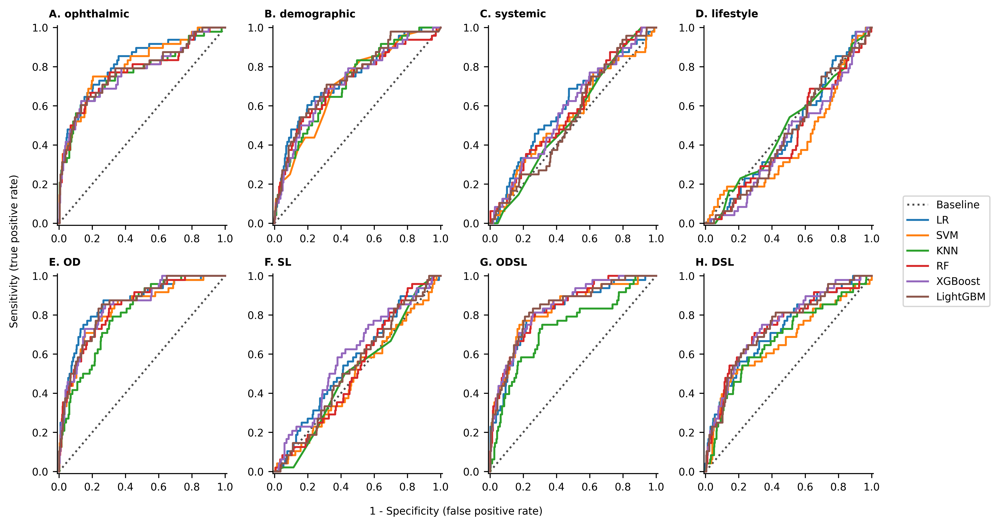

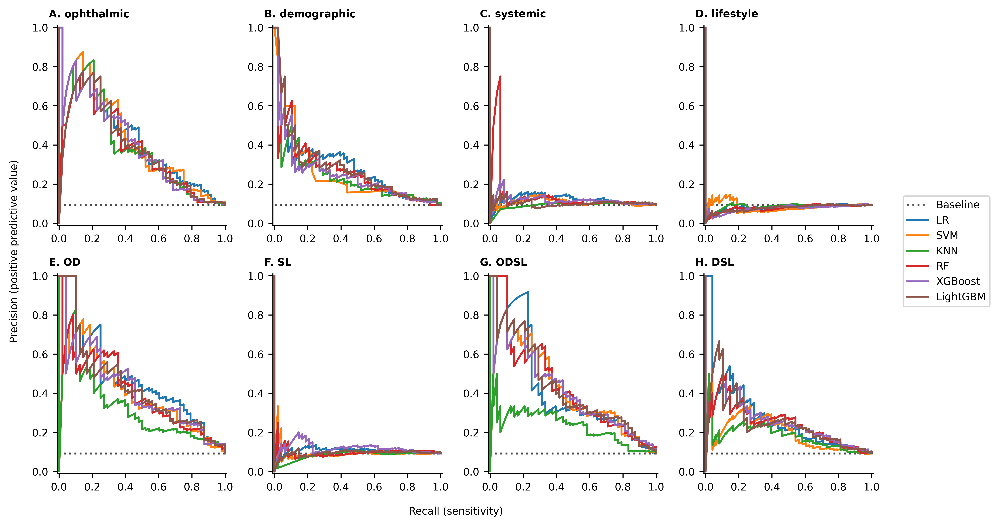

In [11]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)


auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_matched3year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }


    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_matched3year_tte,
        #y_test_matched3year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_matched3year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_matched3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_matched3year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_matched3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_matched3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## Get best model: IOP removed 3 year

#### IOP removed feature set

In [12]:
removed_features = ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference', 
                    'Corneal hysteresis inter-eye difference', 
                    'Spherical equivalent', 'Corneal resistance factor', 
                    'Speech reception threshold', 'Corneal hysteresis',
                    'Tinnitus frequency (self-reported)', 'Arterial stiffness index', 'Private healthcare utilisation', 
                    'Exercise (summed MET minutes per week)', 'Total household income']

# this removes all 'opthalmic' features
model_feature_dict = compare_feature_set_dict = {
    #'ophthalmic': feature_sets.ophthalmic_features['feature'].values[~np.isin(feature_sets.ophthalmic_features['feature'].values, removed_features)],
    'demographic': feature_sets.demographic_features['feature'].values[~np.isin(feature_sets.demographic_features['feature'].values, removed_features)],
    'systemic': feature_sets.systemic_features['feature'].values[~np.isin(feature_sets.systemic_features['feature'].values, removed_features)],
    'lifestyle': feature_sets.lifestyle_features['feature'].values[~np.isin(feature_sets.lifestyle_features['feature'].values, removed_features)],

    #'OD': feature_sets.OD_features['feature'].values[~np.isin(feature_sets.OD_features['feature'].values, removed_features)],
    'SL': feature_sets.SL_features['feature'].values[~np.isin(feature_sets.SL_features['feature'].values, removed_features)],
    #'ODSL': feature_sets.ODSL_features['feature'].values[~np.isin(feature_sets.ODSL_features['feature'].values, removed_features)],
    'DSL': feature_sets.DSL_features['feature'].values[~np.isin(feature_sets.DSL_features['feature'].values, removed_features)],
    'DS': feature_sets.DS_features['feature'].values[~np.isin(feature_sets.DS_features['feature'].values, removed_features)],
    'DL': feature_sets.DL_features['feature'].values[~np.isin(feature_sets.DL_features['feature'].values, removed_features)]}


In [13]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_IOPremoved3year_tte[feature_set]

        estimator = load(f'{model_properties["save_dir"]}.pkl')
        with open(f'{model_properties["save_dir"]}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_IOPremoved3year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_IOPremoved3year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_IOPremoved3year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics["sensitivity_recall"]:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics["specificity"]:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics["ppv_precision"]:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics["npv"]:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics["f1_score"]:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_IOPremoved3year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_IOPremoved3year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_IOPremoved3year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_IOPremoved3year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_IOPremoved3year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_IOPremoved3year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 4.345523776996733e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.725925,0.726 (0.695 - 0.757),0.634 (0.576 - 0.691),0.709 (0.706 - 0.711),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.012 (0.010 - 0.013),0.010 (0.007 - 0.016)
SVM,svm_IOPremoved3year_tte,C: 3.892034004067352e-06 kernel: poly gamma: 1.7349687413659959e-06 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.685753,0.686 (0.654 - 0.717),0.653 (0.595 - 0.710),0.628 (0.625 - 0.631),0.005 (0.004 - 0.005),0.998 (0.998 - 0.999),0.009 (0.008 - 0.011),0.008 (0.005 - 0.017)
KNN,knn_IOPremoved3year_tte,n_neighbors: 487 weights: distance metric: manhattan algorithm: brute,0.656677,0.657 (0.622 - 0.690),0.475 (0.415 - 0.535),0.763 (0.760 - 0.765),0.005 (0.004 - 0.006),0.998 (0.998 - 0.998),0.011 (0.009 - 0.013),0.007 (0.005 - 0.012)
RF,randomforest_IOPremoved3year_tte,n_estimators: 449 max_depth: 6 max_features: 0.7380145658491832 min_samples_leaf: 1061 max_samples: 0.6599727055840994 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.723442,0.723 (0.692 - 0.754),0.611 (0.553 - 0.669),0.709 (0.706 - 0.712),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.011 (0.010 - 0.013),0.010 (0.007 - 0.015)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 476 learning_rate: 0.002300011579650259 max_depth: 5 subsample: 0.6233361444251135 colsample_bytree: 0.7174806633406902 gamma: 0.043590837564669825 lambda: 0.008593475710585104 min_child_weight: 0.023677831304212756 max_bin: 1024 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.728379,0.728 (0.697 - 0.759),0.785 (0.735 - 0.833),0.541 (0.538 - 0.545),0.005 (0.004 - 0.005),0.999 (0.999 - 0.999),0.009 (0.008 - 0.011),0.010 (0.007 - 0.014)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 295 max_bin: 594 learning_rate: 0.1595040303117538 max_depth: 12 num_leaves: 124 bagging_fraction: 0.5687239483316305 feature_fraction: 0.9195981425826315 lambda_l2: 576.3504115559527 min_sum_hessian_in_leaf: 0.21956749387741784 min_data_in_leaf: 2544 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.723741,0.724 (0.693 - 0.755),0.619 (0.560 - 0.676),0.708 (0.705 - 0.711),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.011 (0.010 - 0.013),0.010 (0.007 - 0.014)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 2.208057611872141e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.616707,0.617 (0.583 - 0.650),0.438 (0.378 - 0.498),0.739 (0.737 - 0.742),0.005 (0.004 - 0.005),0.998 (0.998 - 0.998),0.009 (0.007 - 0.011),0.004 (0.004 - 0.006)
SVM,svm_IOPremoved3year_tte,C: 0.0001580462036262767 kernel: rbf gamma: 0.24738644103934884 random_state: 2024 cache_size: 7000 max_iter: 1000,0.524123,0.524 (0.488 - 0.561),0.434 (0.374 - 0.494),0.644 (0.641 - 0.647),0.003 (0.003 - 0.004),0.998 (0.997 - 0.998),0.007 (0.005 - 0.008),0.003 (0.003 - 0.004)
KNN,knn_IOPremoved3year_tte,n_neighbors: 489 weights: distance metric: euclidean algorithm: brute,0.553774,0.554 (0.520 - 0.588),0.634 (0.576 - 0.692),0.462 (0.459 - 0.465),0.003 (0.003 - 0.004),0.998 (0.997 - 0.998),0.006 (0.005 - 0.007),0.003 (0.003 - 0.004)
RF,randomforest_IOPremoved3year_tte,n_estimators: 340 max_depth: 9 max_features: 0.2853684652213473 min_samples_leaf: 1630 max_samples: 0.9275533928768211 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.632020,0.632 (0.599 - 0.665),0.592 (0.533 - 0.651),0.620 (0.617 - 0.623),0.004 (0.004 - 0.005),0.998 (0.998 - 0.999),0.008 (0.007 - 0.010),0.004 (0.004 - 0.006)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 406 learning_rate: 0.025106325749724042 max_depth: 12 subsample: 0.6133199647858937 colsample_bytree: 0.8143768266023388 gamma: 0.0024757217252898305 lambda: 54.515197350818234 min_child_weight: 0.0018212853507541598 max_bin: 976 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.638795,0.639 (0.607 - 0.671),0.589 (0.530 - 0.647),0.635 (0.632 - 0.638),0.004 (0.004 - 0.005),0.998 (0.998 - 0.999),0.009 (0.007 - 0.010),0.005 (0.004 - 0.006)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 250 max_bin: 654 learning_rate: 0.01820005185239339 max_depth: 4 num_leaves: 53 bagging_fraction: 0.5480876769822907 feature_fraction: 0.9374908574361475 lambda_l2: 0.27203423182299535 min_sum_hessian_in_leaf: 0.09049173967928179 min_data_in_leaf: 734 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.639538,0.640 (0.607 - 0.672),0.608 (0.549 - 0.667),0.616 (0.613 - 0.619),0.004 (0.004 - 0.005),0.998 (0.998 - 0.999),0.009 (0.007 - 0.010),0.005 (0.004 - 0.006)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 2.4569005952478315e-06 learning_rate: adaptive eta0: 0.01830117899326463 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.550500,0.550 (0.516 - 0.584),0.751 (0.697 - 0.802),0.337 (0.334 - 0.340),0.003 (0.003 - 0.004),0.998 (0.997 - 0.998),0.006 (0.005 - 0.007),0.003 (0.003 - 0.004)
SVM,svm_IOPremoved3year_tte,C: 2.4727536758557725e-05 kernel: rbf gamma: 0.7335535136137784 random_state: 2024 cache_size: 7000 max_iter: 1000,0.489411,0.489 (0.455 - 0.523),0.943 (0.914 - 0.970),0.077 (0.075 - 0.079),0.003 (0.002 - 0.003),0.998 (0.997 - 0.999),0.006 (0.005 - 0.006),0.003 (0.002 - 0.003)
KNN,knn_IOPremoved3year_tte,n_neighbors: 491 weights: uniform metric: cosine algorithm: brute,0.514859,0.515 (0.483 - 0.548),0.770 (0.717 - 0.821),0.263 (0.260 - 0.265),0.003 (0.002 - 0.003),0.998 (0.997 - 0.998),0.006 (0.005 - 0.006),0.003 (0.002 - 0.003)
RF,randomforest_IOPremoved3year_tte,n_estimators: 390 max_depth: 38 max_features: 0.24883709683214056 min_samples_leaf: 2092 max_samples: 0.52205066665131 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.522841,0.523 (0.488 - 0.558),0.694 (0.638 - 0.750),0.367 (0.364 - 0.370),0.003 (0.003 - 0.003),0.998 (0.997 - 0.998),0.006 (0.005 - 0.007),0.003 (0.002 - 0.003)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 446 learning_rate: 0.039903367998686344 max_depth: 3 subsample: 0.9420640182507022 colsample_bytree: 0.8341501294651018 gamma: 0.00020374215851158342 lambda: 0.0031274823025551853 min_child_weight: 0.8453415141178308 max_bin: 302 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.507888,0.508 (0.472 - 0.543),0.842 (0.795 - 0.884),0.193 (0.191 - 0.196),0.003 (0.002 - 0.003),0.998 (0.997 - 0.998),0.006 (0.005 - 0.006),0.003 (0.002 - 0.004)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 327 max_bin: 990 learning_rate: 0.05035348206964178 max_depth: 3 num_leaves: 61 bagging_fraction: 0.5521130212712766 feature_fraction: 0.6159564171938172 lambda_l2: 0.49288154149837576 min_sum_hessian_in_leaf: 1.111781497395647 min_data_in_leaf: 590 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.526200,0.526 (0.492 - 0.559),0.834 (0.788 - 0.878),0.247 (0.244 - 0.249),0.003 (0.003 - 0.003),0.998 (0.998 - 0.999),0.006 (0.005 - 0.007),0.003 (0.002 - 0.003)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 2.206801316791154e-06 learning_rate: adaptive eta0: 0.08009585005565585 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.632389,0.632 (0.599 - 0.666),0.698 (0.643 - 0.753),0.498 (0.495 - 0.501),0.004 (0.003 - 0.004),0.998 (0.998 - 0.999),0.008 (0.006 - 0.009),0.005 (0.004 - 0.006)
SVM,svm_IOPremoved3year_tte,C: 7.133354461964929 kernel: rbf gamma: 0.5888086319929978 random_state: 2024 cache_size: 7000 max_iter: 1000,0.549657,0.550 (0.514 - 0.584),0.392 (0.333 - 0.452),0.707 (0.704 - 0.710),0.004 (0.003 - 0.004),0.998 (0.997 - 0.998),0.007 (0.006 - 0.009),0.003 (0.003 - 0.004)
KNN,knn_IOPremoved3year_tte,n_neighbors: 457 weights: distance metric: manhattan algorithm: brute,0.540718,0.541 (0.506 - 0.576),0.540 (0.479 - 0.601),0.539 (0.536 - 0.542),0.003 (0.003 - 0.004),0.998 (0.997 - 0.998),0.006 (0.005 - 0.007),0.003 (0.003 - 0.006)
RF,randomforest_IOPremoved3year_tte,n_estimators: 257 max_depth: 42 max_features: 0.20673883126141934 min_samples_leaf: 1134 max_samples: 0.9116039122876324 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.628075,0.628 (0.594 - 0.661),0.589 (0.530 - 0.648),0.627 (0.624 - 0.630),0.004 (0.004 - 0.005),0.998 (0.998 - 0.999),0.009 (0.007 - 0.010),0.005 (0.004 - 0.007)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 185 learning_rate: 0.026265856568392035 max_depth: 8 subsample: 0.937839054064912 colsample_bytree: 0.5013160651618016 gamma: 0.5596373431939985 lambda: 8.0639149453577 min_child_weight: 0.004697058455406444 max_bin: 162 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.632358,0.632 (0.599 - 0.666),0.755 (0.701 - 0.806),0.451 (0.448 - 0.454),0.004 (0.003 - 0.004),0.999 (0.998 - 0.999),0.007 (0.006 - 0.008),0.005 (0.004 - 0.007)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 406 max_bin: 196 learning_rate: 0.008353826163036298 max_depth: 3 num_leaves: 101 bagging_fraction: 0.5355584029558119 feature_fraction: 0.6606874565033972 lambda_l2: 0.10997359699798373 min_sum_hessian_in_leaf: 0.05978075038134105 min_data_in_leaf: 918 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.644676,0.645 (0.611 - 0.678),0.525 (0.464 - 0.586),0.679 (0.676 - 0.682),0.004 (0.004 - 0.005),0.998 (0.998 - 0.998),0.009 (0.007 - 0.010),0.005 (0.004 - 0.007)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 3.701896945225811e-06 learning_rate: adaptive eta0: 0.09980551935132909 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.732914,0.733 (0.701 - 0.764),0.638 (0.580 - 0.695),0.714 (0.711 - 0.717),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.012 (0.010 - 0.014),0.011 (0.008 - 0.020)
SVM,svm_IOPremoved3year_tte,C: 0.0005209900652193134 kernel: poly gamma: 1.0407005920496683e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.603180,0.603 (0.569 - 0.637),0.581 (0.520 - 0.640),0.583 (0.580 - 0.586),0.004 (0.003 - 0.004),0.998 (0.998 - 0.998),0.008 (0.006 - 0.009),0.004 (0.003 - 0.005)
KNN,knn_IOPremoved3year_tte,n_neighbors: 485 weights: distance metric: manhattan algorithm: brute,0.575377,0.575 (0.542 - 0.609),0.691 (0.634 - 0.746),0.442 (0.438 - 0.445),0.003 (0.003 - 0.004),0.998 (0.998 - 0.998),0.007 (0.006 - 0.008),0.004 (0.003 - 0.005)
RF,randomforest_IOPremoved3year_tte,n_estimators: 307 max_depth: 46 max_features: 0.40303699624167955 min_samples_leaf: 1097 max_samples: 0.7244626569511932 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.715064,0.715 (0.681 - 0.748),0.649 (0.591 - 0.705),0.687 (0.684 - 0.689),0.006 (0.005 - 0.006),0.999 (0.998 - 0.999),0.011 (0.010 - 0.013),0.010 (0.007 - 0.014)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 450 learning_rate: 0.02171558846013773 max_depth: 3 subsample: 0.5403503139780911 colsample_bytree: 0.5614192555467364 gamma: 0.1272185561041479 lambda: 0.10559182270165351 min_child_weight: 0.13058024674367796 max_bin: 358 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.727770,0.728 (0.695 - 0.760),0.592 (0.533 - 0.651),0.748 (0.745 - 0.751),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.013 (0.011 - 0.015),0.010 (0.008 - 0.015)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 393 max_bin: 807 learning_rate: 0.02091811875427728 max_depth: 3 num_leaves: 12 bagging_fraction: 0.9010815997526082 feature_fraction: 0.6817677355918367 lambda_l2: 2.0517505883230416 min_sum_hessian_in_leaf: 0.13319383050793057 min_data_in_leaf: 1778 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.728564,0.729 (0.696 - 0.760),0.619 (0.560 - 0.677),0.728 (0.726 - 0.731),0.006 (0.005 - 0.007),0.999 (0.998 - 0.999),0.012 (0.010 - 0.014),0.011 (0.008 - 0.017)


DS
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 5.506411718384219e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.729930,0.730 (0.698 - 0.761),0.706 (0.651 - 0.759),0.639 (0.636 - 0.642),0.005 (0.005 - 0.006),0.999 (0.998 - 0.999),0.011 (0.009 - 0.012),0.010 (0.008 - 0.014)
SVM,svm_IOPremoved3year_tte,C: 0.00013031291063189836 kernel: poly gamma: 1.4513888820002227e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.657635,0.658 (0.622 - 0.693),0.589 (0.530 - 0.648),0.673 (0.670 - 0.676),0.005 (0.004 - 0.006),0.998 (0.998 - 0.999),0.010 (0.008 - 0.011),0.007 (0.005 - 0.013)
KNN,knn_IOPremoved3year_tte,n_neighbors: 497 weights: distance metric: manhattan algorithm: brute,0.594249,0.594 (0.559 - 0.629),0.385 (0.327 - 0.443),0.764 (0.762 - 0.767),0.004 (0.004 - 0.005),0.998 (0.997 - 0.998),0.009 (0.007 - 0.010),0.005 (0.004 - 0.006)
RF,randomforest_IOPremoved3year_tte,n_estimators: 126 max_depth: 6 max_features: 0.5076297849029222 min_samples_leaf: 988 max_samples: 0.7527287952944407 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.722781,0.723 (0.690 - 0.754),0.653 (0.596 - 0.709),0.681 (0.678 - 0.684),0.006 (0.005 - 0.006),0.999 (0.998 - 0.999),0.011 (0.009 - 0.013),0.010 (0.007 - 0.014)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 399 learning_rate: 0.02023709609652773 max_depth: 4 subsample: 0.6944917198845507 colsample_bytree: 0.9037605208936939 gamma: 0.028962542332532978 lambda: 1.870310052578363 min_child_weight: 0.02832468289181461 max_bin: 406 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.728954,0.729 (0.697 - 0.761),0.694 (0.638 - 0.749),0.655 (0.652 - 0.658),0.005 (0.005 - 0.006),0.999 (0.998 - 0.999),0.011 (0.009 - 0.012),0.011 (0.008 - 0.017)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 150 max_bin: 627 learning_rate: 0.04004319449834884 max_depth: 3 num_leaves: 79 bagging_fraction: 0.8895738897193374 feature_fraction: 0.7438290239198972 lambda_l2: 0.01146843969393926 min_sum_hessian_in_leaf: 0.00022662106459591134 min_data_in_leaf: 2087 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.729107,0.729 (0.697 - 0.761),0.468 (0.409 - 0.528),0.866 (0.864 - 0.868),0.009 (0.008 - 0.011),0.998 (0.998 - 0.999),0.018 (0.015 - 0.022),0.011 (0.008 - 0.015)


DL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved3year_tte,alpha: 1.1552810396243122e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.727083,0.727 (0.696 - 0.757),0.732 (0.678 - 0.785),0.598 (0.594 - 0.601),0.005 (0.004 - 0.006),0.999 (0.998 - 0.999),0.010 (0.008 - 0.011),0.010 (0.007 - 0.015)
SVM,svm_IOPremoved3year_tte,C: 0.03358059073214989 kernel: poly gamma: 1.1632245795669683e-06 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.637261,0.637 (0.603 - 0.671),0.574 (0.515 - 0.632),0.654 (0.651 - 0.657),0.004 (0.004 - 0.005),0.998 (0.998 - 0.999),0.009 (0.008 - 0.010),0.006 (0.004 - 0.009)
KNN,knn_IOPremoved3year_tte,n_neighbors: 403 weights: distance metric: manhattan algorithm: brute,0.558924,0.559 (0.525 - 0.593),0.725 (0.671 - 0.778),0.374 (0.371 - 0.377),0.003 (0.003 - 0.004),0.998 (0.998 - 0.998),0.006 (0.005 - 0.007),0.004 (0.003 - 0.004)
RF,randomforest_IOPremoved3year_tte,n_estimators: 253 max_depth: 8 max_features: 0.5251750831602512 min_samples_leaf: 566 max_samples: 0.7274485146229166 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.721823,0.722 (0.689 - 0.754),0.574 (0.513 - 0.632),0.753 (0.750 - 0.756),0.006 (0.005 - 0.007),0.998 (0.998 - 0.999),0.012 (0.011 - 0.014),0.010 (0.007 - 0.013)
XGBoost,xgboost_IOPremoved3year_tte,n_estimators: 475 learning_rate: 0.02531529179465331 max_depth: 3 subsample: 0.508303648827805 colsample_bytree: 0.5004195202568832 gamma: 0.026805915219515135 lambda: 2.57944418196988 min_child_weight: 13.500686790216825 max_bin: 253 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.725373,0.725 (0.694 - 0.756),0.558 (0.498 - 0.618),0.787 (0.784 - 0.790),0.007 (0.006 - 0.008),0.998 (0.998 - 0.999),0.014 (0.012 - 0.016),0.010 (0.007 - 0.015)
LightGBM,lightgbm_IOPremoved3year_tte,n_estimators: 456 max_bin: 808 learning_rate: 0.018038959912326645 max_depth: 3 num_leaves: 14 bagging_fraction: 0.6835854527075522 feature_fraction: 0.5738479184434923 lambda_l2: 1.5645304125955386 min_sum_hessian_in_leaf: 0.025364717005856307 min_data_in_leaf: 4672 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.724856,0.725 (0.693 - 0.756),0.566 (0.506 - 0.625),0.774 (0.772 - 0.777),0.007 (0.006 - 0.008),0.998 (0.998 - 0.999),0.013 (0.011 - 0.016),0.011 (0.008 - 0.017)


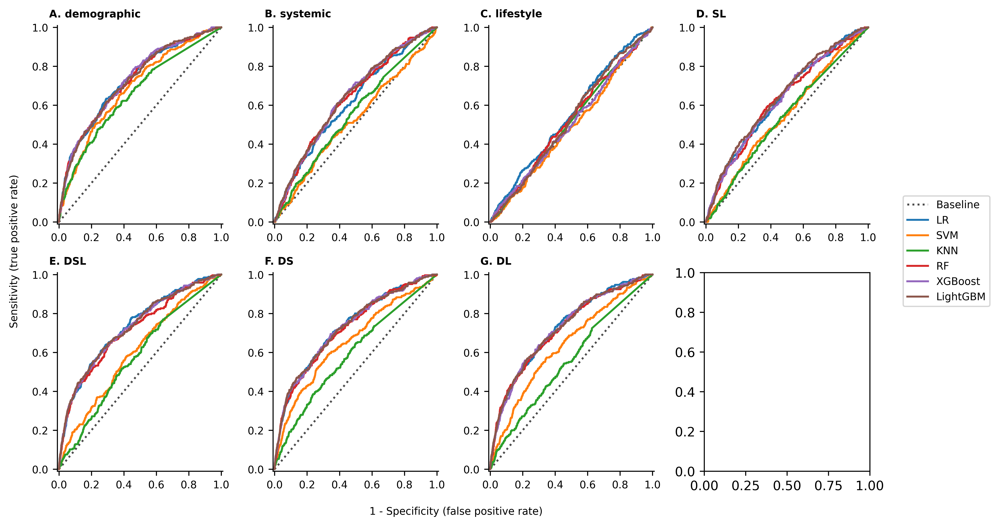

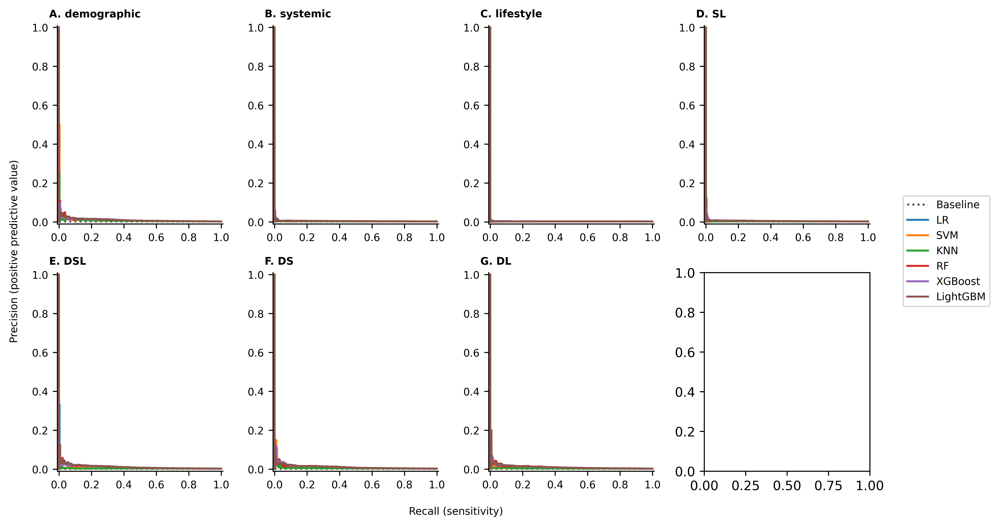

In [14]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_IOPremoved3year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_IOPremoved3year_tte,
        #y_test_IOPremoved3year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_IOPremoved3year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_IOPremoved3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_IOPremoved3year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_IOPremoved3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_IOPremoved3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

## RNFL

In [18]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_3year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_3year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_3year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_3year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_3year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_3year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_3year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_rnfl3year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_rnfl3year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_rnfl3year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 1.0076388465175835e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.828272,0.828 (0.753 - 0.896),0.792 (0.667 - 0.903),0.786 (0.781 - 0.792),0.008 (0.006 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.021),0.043 (0.018 - 0.099)
SVM,svm_rnfl3year_tte,C: 0.1976261072289333 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.812558,0.813 (0.737 - 0.879),0.771 (0.646 - 0.886),0.779 (0.774 - 0.785),0.008 (0.005 - 0.010),0.999 (0.999 - 1.000),0.015 (0.011 - 0.020),0.043 (0.017 - 0.098)
KNN,knn_rnfl3year_tte,n_neighbors: 497 weights: distance metric: cosine algorithm: brute,0.779131,0.779 (0.699 - 0.855),0.625 (0.482 - 0.763),0.864 (0.859 - 0.868),0.010 (0.007 - 0.014),0.999 (0.999 - 0.999),0.020 (0.013 - 0.027),0.075 (0.025 - 0.169)
RF,randomforest_rnfl3year_tte,n_estimators: 182 max_depth: 27 max_features: 0.9992072899765376 min_samples_leaf: 825 max_samples: 0.5758047660283868 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.818128,0.818 (0.743 - 0.882),0.729 (0.600 - 0.854),0.785 (0.780 - 0.791),0.007 (0.005 - 0.010),0.999 (0.999 - 1.000),0.015 (0.010 - 0.020),0.028 (0.012 - 0.056)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 319 learning_rate: 0.003705904361283586 max_depth: 7 subsample: 0.6946944371308693 colsample_bytree: 0.8139855296296439 gamma: 0.46732221143090474 lambda: 2.5410349234566105 min_child_weight: 3.240040627004472 max_bin: 546 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.833497,0.833 (0.761 - 0.896),0.792 (0.667 - 0.903),0.750 (0.744 - 0.756),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.010 - 0.018),0.070 (0.020 - 0.151)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 400 max_bin: 144 learning_rate: 0.01602365405046454 max_depth: 5 num_leaves: 27 bagging_fraction: 0.8641393249269834 feature_fraction: 0.8888690045794231 lambda_l2: 94.7631480422274 min_sum_hessian_in_leaf: 0.0014246555615558332 min_data_in_leaf: 2835 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.827181,0.827 (0.754 - 0.892),0.750 (0.622 - 0.870),0.810 (0.805 - 0.815),0.009 (0.006 - 0.012),0.999 (0.999 - 1.000),0.017 (0.012 - 0.023),0.044 (0.018 - 0.101)


demographic
LR
SVM


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)


KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 3.951615506280153e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.792139,0.792 (0.721 - 0.860),0.625 (0.488 - 0.763),0.849 (0.844 - 0.854),0.009 (0.006 - 0.012),0.999 (0.999 - 0.999),0.018 (0.012 - 0.024),0.016 (0.008 - 0.034)
SVM,svm_rnfl3year_tte,C: 2.3153721373055616 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.496999,0.497 (0.407 - 0.586),0.188 (0.081 - 0.305),0.913 (0.909 - 0.916),0.005 (0.002 - 0.008),0.998 (0.997 - 0.999),0.009 (nan - nan),0.003 (0.002 - 0.005)
KNN,knn_rnfl3year_tte,n_neighbors: 495 weights: distance metric: euclidean algorithm: brute,0.638166,0.638 (0.553 - 0.724),0.458 (0.319 - 0.604),0.797 (0.792 - 0.803),0.005 (0.003 - 0.007),0.998 (0.998 - 0.999),0.010 (0.006 - 0.014),0.007 (0.003 - 0.016)
RF,randomforest_rnfl3year_tte,n_estimators: 469 max_depth: 5 max_features: 0.5265736197445638 min_samples_leaf: 1102 max_samples: 0.9113645475519474 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.758633,0.759 (0.675 - 0.836),0.688 (0.553 - 0.814),0.786 (0.780 - 0.791),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.009 - 0.019),0.013 (0.007 - 0.027)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 418 learning_rate: 0.007619542430624336 max_depth: 3 subsample: 0.573745769689846 colsample_bytree: 0.7098864208844635 gamma: 0.06867234180227437 lambda: 0.019670747560476754 min_child_weight: 0.00020145585061446183 max_bin: 170 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.786696,0.787 (0.712 - 0.856),0.625 (0.488 - 0.760),0.858 (0.853 - 0.862),0.010 (0.006 - 0.013),0.999 (0.999 - 0.999),0.019 (0.012 - 0.026),0.013 (0.007 - 0.025)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 51 max_bin: 420 learning_rate: 0.031739836497232325 max_depth: 3 num_leaves: 60 bagging_fraction: 0.7732352344163054 feature_fraction: 0.9417946644524895 lambda_l2: 0.7890220098746682 min_sum_hessian_in_leaf: 0.002404138881216812 min_data_in_leaf: 2421 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.772138,0.772 (0.691 - 0.847),0.625 (0.488 - 0.760),0.843 (0.838 - 0.848),0.009 (0.006 - 0.012),0.999 (0.999 - 0.999),0.017 (0.011 - 0.023),0.014 (0.007 - 0.026)


systemic
LR
SVM
KNN


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered i

RF
XGBoost
LightGBM
Best model: SVM (svm_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 0.013819406507775432 learning_rate: constant eta0: 0.0076244564123687485 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.569701,0.570 (0.484 - 0.654),0.479 (0.333 - 0.623),0.685 (0.679 - 0.692),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.003 (0.002 - 0.005)
SVM,svm_rnfl3year_tte,C: 0.011358448121787003 kernel: rbf gamma: 5.1026759080055095 random_state: 2024 cache_size: 7000 max_iter: 1000,0.607221,0.607 (0.531 - 0.684),0.708 (0.575 - 0.833),0.495 (0.488 - 0.502),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.008),0.003 (0.002 - 0.006)
KNN,knn_rnfl3year_tte,n_neighbors: 105 weights: uniform metric: manhattan algorithm: brute,0.476285,0.476 (0.426 - 0.533),0.042 (0.000 - 0.109),0.985 (0.983 - 0.986),0.006 (0.000 - 0.015),0.998 (0.997 - 0.998),0.010 (nan - nan),0.002 (0.001 - 0.004)
RF,randomforest_rnfl3year_tte,n_estimators: 213 max_depth: 20 max_features: 0.5534817841788676 min_samples_leaf: 2251 max_samples: 0.780431636648047 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.585190,0.585 (0.499 - 0.668),0.438 (0.300 - 0.581),0.745 (0.739 - 0.751),0.004 (0.002 - 0.005),0.998 (0.998 - 0.999),0.008 (0.004 - 0.011),0.005 (0.002 - 0.014)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 421 learning_rate: 0.0013924873065524687 max_depth: 5 subsample: 0.9867342031310101 colsample_bytree: 0.5447068608933525 gamma: 0.01901132684498956 lambda: 0.499275684273926 min_child_weight: 1.9926095746885981 max_bin: 638 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.583790,0.584 (0.497 - 0.667),0.500 (0.359 - 0.638),0.664 (0.658 - 0.670),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.004 (0.002 - 0.007)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 228 max_bin: 856 learning_rate: 0.004349318812073576 max_depth: 4 num_leaves: 80 bagging_fraction: 0.6927954310521856 feature_fraction: 0.760904242481961 lambda_l2: 0.7805046642070679 min_sum_hessian_in_leaf: 0.03296967416377567 min_data_in_leaf: 670 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.594228,0.594 (0.512 - 0.673),0.667 (0.527 - 0.800),0.506 (0.500 - 0.513),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.008),0.006 (0.002 - 0.018)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: KNN (knn_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 7.55180100106516e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.488795,0.489 (0.407 - 0.573),0.958 (0.894 - 1.000),0.115 (0.111 - 0.119),0.002 (0.002 - 0.003),0.999 (0.998 - 1.000),0.005 (0.003 - 0.006),0.002 (0.002 - 0.005)
SVM,svm_rnfl3year_tte,C: 0.0001465952603801968 kernel: rbf gamma: 2.138632851265712e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.511683,0.512 (0.433 - 0.594),0.958 (0.893 - 1.000),0.124 (0.120 - 0.129),0.002 (0.002 - 0.003),0.999 (0.998 - 1.000),0.005 (0.003 - 0.006),0.002 (0.002 - 0.003)
KNN,knn_rnfl3year_tte,n_neighbors: 277 weights: uniform metric: cosine algorithm: brute,0.550289,0.550 (0.474 - 0.628),0.542 (0.400 - 0.685),0.547 (0.540 - 0.553),0.003 (0.002 - 0.004),0.998 (0.997 - 0.999),0.005 (0.003 - 0.007),0.003 (0.002 - 0.004)
RF,randomforest_rnfl3year_tte,n_estimators: 189 max_depth: 27 max_features: 0.5397650081985367 min_samples_leaf: 10 max_samples: 0.9187573278988886 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.433201,0.433 (0.362 - 0.505),0.854 (0.750 - 0.947),0.159 (0.155 - 0.164),0.002 (0.002 - 0.003),0.998 (0.996 - 0.999),0.004 (0.003 - 0.006),0.002 (0.001 - 0.002)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 462 learning_rate: 0.0013669080537636487 max_depth: 11 subsample: 0.5000185761818975 colsample_bytree: 0.6523584260614502 gamma: 0.0640767149439846 lambda: 0.0018160173254542957 min_child_weight: 0.03582056297885345 max_bin: 811 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.416792,0.417 (0.342 - 0.493),0.979 (0.930 - 1.000),0.040 (0.038 - 0.043),0.002 (0.002 - 0.003),0.999 (0.996 - 1.000),0.004 (0.003 - 0.006),0.002 (0.001 - 0.002)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 264 max_bin: 515 learning_rate: 0.2732360285723693 max_depth: 4 num_leaves: 103 bagging_fraction: 0.5299048124225918 feature_fraction: 0.8346219918824225 lambda_l2: 0.3462728348792087 min_sum_hessian_in_leaf: 0.06491807039931409 min_data_in_leaf: 2064 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.402949,0.403 (0.330 - 0.479),0.958 (0.893 - 1.000),0.074 (0.070 - 0.077),0.002 (0.002 - 0.003),0.999 (0.997 - 1.000),0.005 (0.003 - 0.006),0.002 (0.001 - 0.002)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 1.0271505621690679e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.876189,0.876 (0.824 - 0.923),0.750 (0.622 - 0.868),0.878 (0.874 - 0.883),0.013 (0.009 - 0.018),0.999 (0.999 - 1.000),0.026 (0.018 - 0.035),0.036 (0.016 - 0.091)
SVM,svm_rnfl3year_tte,C: 6.863644335313159 kernel: rbf gamma: 3.0023566570364548e-05 random_state: 2024 cache_size: 7000 max_iter: 1000,0.792159,0.792 (0.730 - 0.850),0.812 (0.696 - 0.918),0.638 (0.631 - 0.644),0.005 (0.003 - 0.006),0.999 (0.999 - 1.000),0.010 (0.007 - 0.013),0.018 (0.007 - 0.043)
KNN,knn_rnfl3year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.688680,0.689 (0.602 - 0.772),0.458 (0.317 - 0.600),0.857 (0.852 - 0.862),0.007 (0.004 - 0.010),0.999 (0.998 - 0.999),0.014 (0.008 - 0.020),0.014 (0.006 - 0.033)
RF,randomforest_rnfl3year_tte,n_estimators: 152 max_depth: 22 max_features: 0.22648272225438199 min_samples_leaf: 178 max_samples: 0.6718420589879384 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.851873,0.852 (0.785 - 0.911),0.792 (0.667 - 0.902),0.822 (0.817 - 0.827),0.010 (0.007 - 0.013),0.999 (0.999 - 1.000),0.019 (0.013 - 0.025),0.066 (0.025 - 0.145)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 328 learning_rate: 0.011902604076503592 max_depth: 3 subsample: 0.7649787129725194 colsample_bytree: 0.8442251686990919 gamma: 0.0022584918286784224 lambda: 0.2874376207168238 min_child_weight: 2.3338248630203555 max_bin: 405 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.875922,0.876 (0.820 - 0.925),0.833 (0.720 - 0.935),0.811 (0.805 - 0.816),0.010 (0.007 - 0.013),1.000 (0.999 - 1.000),0.019 (0.013 - 0.025),0.088 (0.032 - 0.176)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 310 max_bin: 411 learning_rate: 0.01316745967200779 max_depth: 3 num_leaves: 82 bagging_fraction: 0.6603133035802546 feature_fraction: 0.9075586508787216 lambda_l2: 0.3314807342145946 min_sum_hessian_in_leaf: 0.026520023035831834 min_data_in_leaf: 2118 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.872149,0.872 (0.815 - 0.924),0.812 (0.694 - 0.918),0.850 (0.846 - 0.855),0.012 (0.008 - 0.016),1.000 (0.999 - 1.000),0.023 (0.016 - 0.031),0.093 (0.032 - 0.187)


SL
LR
SVM
KNN


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeW

RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl3year_tte)


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:122: RuntimeWarning: invalid value encountered in scalar divide
  ppv = tp / (tp + fp)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 6.997143490297965 learning_rate: adaptive eta0: 0.015405152684930116 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.583684,0.584 (0.499 - 0.664),0.667 (0.525 - 0.800),0.523 (0.516 - 0.529),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.008),0.003 (0.002 - 0.004)
SVM,svm_rnfl3year_tte,C: 0.0003598556269100699 kernel: rbf gamma: 0.23580889515552073 random_state: 2024 cache_size: 7000 max_iter: 1000,0.555252,0.555 (0.469 - 0.643),0.417 (0.277 - 0.558),0.724 (0.718 - 0.730),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.010),0.003 (0.002 - 0.004)
KNN,knn_rnfl3year_tte,n_neighbors: 199 weights: uniform metric: cosine algorithm: brute,0.450294,0.450 (0.395 - 0.512),0.000 (0.000 - 0.000),1.000 (1.000 - 1.000),nan (nan - nan),0.998 (0.997 - 0.998),nan (nan - nan),0.002 (0.001 - 0.002)
RF,randomforest_rnfl3year_tte,n_estimators: 99 max_depth: 40 max_features: 0.20920361987371672 min_samples_leaf: 2888 max_samples: 0.6940331773781053 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.571745,0.572 (0.488 - 0.653),0.500 (0.360 - 0.641),0.669 (0.662 - 0.675),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.003 (0.002 - 0.006)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 128 learning_rate: 0.0013548305597601055 max_depth: 7 subsample: 0.7649201022976775 colsample_bytree: 0.847158117635286 gamma: 0.0016727331180684591 lambda: 0.06168833876262287 min_child_weight: 0.0017461334798965355 max_bin: 649 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.595078,0.595 (0.515 - 0.672),0.604 (0.462 - 0.740),0.582 (0.576 - 0.589),0.003 (0.002 - 0.004),0.998 (0.998 - 0.999),0.006 (0.004 - 0.009),0.004 (0.002 - 0.007)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 132 max_bin: 659 learning_rate: 0.0014007253380263769 max_depth: 3 num_leaves: 67 bagging_fraction: 0.622222983442822 feature_fraction: 0.6995016207578353 lambda_l2: 221.43850452946702 min_sum_hessian_in_leaf: 0.1743019584570524 min_data_in_leaf: 2748 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.583800,0.584 (0.504 - 0.662),0.438 (0.294 - 0.581),0.752 (0.747 - 0.758),0.004 (0.002 - 0.006),0.998 (0.998 - 0.999),0.008 (0.004 - 0.011),0.004 (0.002 - 0.012)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 2.9633920300243937e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.850736,0.851 (0.790 - 0.908),0.729 (0.600 - 0.854),0.885 (0.881 - 0.889),0.014 (0.010 - 0.019),0.999 (0.999 - 1.000),0.027 (0.019 - 0.036),0.038 (0.016 - 0.083)
SVM,svm_rnfl3year_tte,C: 0.0008148720300286303 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.677228,0.677 (0.600 - 0.754),0.833 (0.720 - 0.933),0.441 (0.434 - 0.447),0.003 (0.002 - 0.004),0.999 (0.999 - 1.000),0.007 (0.005 - 0.009),0.019 (0.004 - 0.084)
KNN,knn_rnfl3year_tte,n_neighbors: 497 weights: distance metric: manhattan algorithm: brute,0.545948,0.546 (0.462 - 0.633),0.312 (0.182 - 0.450),0.822 (0.816 - 0.827),0.004 (0.002 - 0.006),0.998 (0.997 - 0.999),0.008 (0.004 - 0.012),0.004 (0.002 - 0.011)
RF,randomforest_rnfl3year_tte,n_estimators: 95 max_depth: 34 max_features: 0.042494688755373544 min_samples_leaf: 3821 max_samples: 0.6757058341459521 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.817497,0.817 (0.748 - 0.880),0.750 (0.622 - 0.868),0.759 (0.753 - 0.765),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.009 - 0.018),0.052 (0.014 - 0.122)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 486 learning_rate: 0.006371786535006629 max_depth: 3 subsample: 0.6778871939455526 colsample_bytree: 0.8749960620380874 gamma: 0.06291495824686291 lambda: 0.0010237053544822285 min_child_weight: 0.0017102345542914948 max_bin: 762 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.860761,0.861 (0.805 - 0.910),0.771 (0.644 - 0.886),0.835 (0.830 - 0.839),0.010 (0.007 - 0.014),0.999 (0.999 - 1.000),0.020 (0.014 - 0.027),0.060 (0.026 - 0.121)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 327 max_bin: 556 learning_rate: 0.08642869527496565 max_depth: 3 num_leaves: 62 bagging_fraction: 0.5055005681313156 feature_fraction: 0.9962659038479191 lambda_l2: 167.39559400189856 min_sum_hessian_in_leaf: 0.006563484687173881 min_data_in_leaf: 69 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.858188,0.858 (0.797 - 0.913),0.792 (0.672 - 0.902),0.846 (0.841 - 0.850),0.011 (0.008 - 0.015),0.999 (0.999 - 1.000),0.022 (0.015 - 0.029),0.065 (0.021 - 0.138)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl3year_tte,alpha: 5.588628387915202e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.773381,0.773 (0.701 - 0.842),0.646 (0.510 - 0.778),0.817 (0.812 - 0.823),0.008 (0.005 - 0.011),0.999 (0.999 - 0.999),0.015 (0.010 - 0.021),0.015 (0.007 - 0.035)
SVM,svm_rnfl3year_tte,C: 0.0010752201964006009 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.621285,0.621 (0.537 - 0.703),0.708 (0.574 - 0.833),0.512 (0.506 - 0.519),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.009),0.008 (0.003 - 0.047)
KNN,knn_rnfl3year_tte,n_neighbors: 499 weights: uniform metric: manhattan algorithm: brute,0.530708,0.531 (0.449 - 0.614),0.312 (0.184 - 0.447),0.768 (0.763 - 0.774),0.003 (0.002 - 0.005),0.998 (0.997 - 0.999),0.006 (0.003 - 0.009),0.003 (0.002 - 0.006)
RF,randomforest_rnfl3year_tte,n_estimators: 95 max_depth: 35 max_features: 0.6849629227147209 min_samples_leaf: 4218 max_samples: 0.9797113372820265 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.756080,0.756 (0.678 - 0.830),0.708 (0.571 - 0.833),0.742 (0.736 - 0.747),0.006 (0.004 - 0.008),0.999 (0.999 - 1.000),0.012 (0.008 - 0.016),0.016 (0.006 - 0.042)
XGBoost,xgboost_rnfl3year_tte,n_estimators: 384 learning_rate: 0.004789919089023362 max_depth: 4 subsample: 0.8300487026295811 colsample_bytree: 0.8851502951909359 gamma: 0.6199830712508938 lambda: 0.03839876077173887 min_child_weight: 3.4662979034852044 max_bin: 1021 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.774689,0.775 (0.705 - 0.841),0.604 (0.463 - 0.741),0.828 (0.823 - 0.833),0.008 (0.005 - 0.011),0.999 (0.998 - 0.999),0.015 (0.010 - 0.021),0.013 (0.006 - 0.025)
LightGBM,lightgbm_rnfl3year_tte,n_estimators: 208 max_bin: 432 learning_rate: 0.012606430220207835 max_depth: 5 num_leaves: 49 bagging_fraction: 0.869282115674008 feature_fraction: 0.857944506336501 lambda_l2: 0.9419245294479396 min_sum_hessian_in_leaf: 0.019878805971876592 min_data_in_leaf: 3773 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.774243,0.774 (0.705 - 0.841),0.562 (0.420 - 0.705),0.850 (0.846 - 0.855),0.008 (0.005 - 0.011),0.999 (0.998 - 0.999),0.016 (0.010 - 0.022),0.014 (0.007 - 0.029)


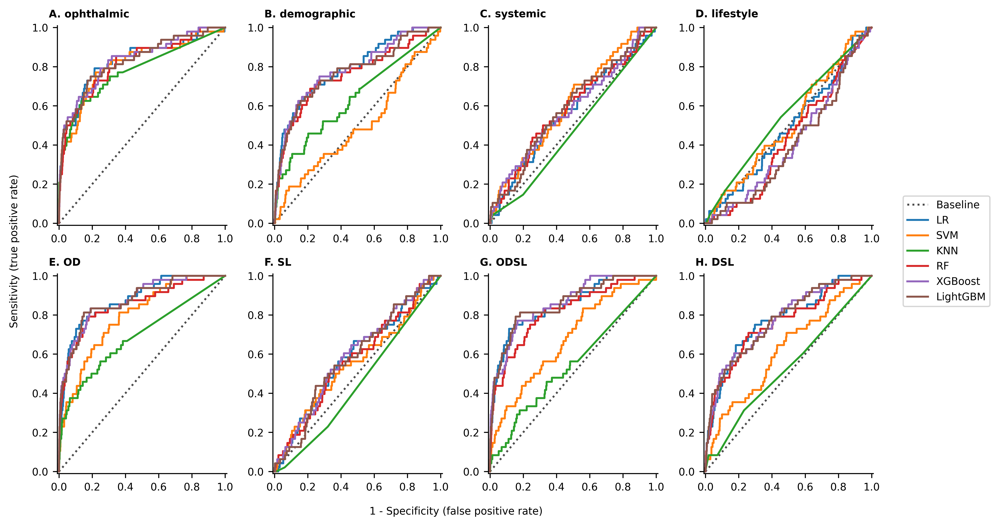

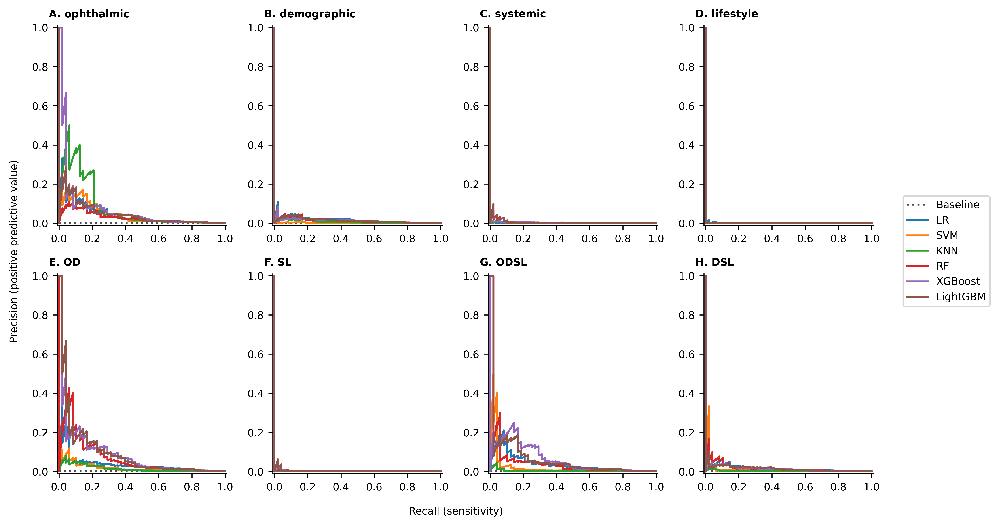

In [19]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)


auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_3year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_3year_tte,
        #y_test_3year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_3year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_rnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_3year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_rnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_rnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

## get best model: no IOP RNFL

In [6]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_3year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_3year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_3year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_3year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_3year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_3year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_3year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_noIOPrnfl3year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_noIOPrnfl3year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_noIOPrnfl3year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 1.0163489192509507e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.782697,0.783 (0.706 - 0.852),0.688 (0.551 - 0.816),0.785 (0.780 - 0.791),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.009 - 0.019),0.014 (0.007 - 0.026)
SVM,svm_noIOPrnfl3year_tte,C: 4.952293272170242 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.830999,0.831 (0.767 - 0.888),0.896 (0.804 - 0.977),0.623 (0.617 - 0.630),0.005 (0.004 - 0.007),1.000 (0.999 - 1.000),0.010 (0.007 - 0.014),0.031 (0.013 - 0.064)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 447 weights: uniform metric: cosine algorithm: brute,0.740933,0.741 (0.660 - 0.816),0.542 (0.400 - 0.682),0.865 (0.860 - 0.869),0.009 (0.006 - 0.012),0.999 (0.998 - 0.999),0.017 (0.011 - 0.024),0.028 (0.010 - 0.065)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 369 max_depth: 30 max_features: 0.8899434831528911 min_samples_leaf: 561 max_samples: 0.95131691531778 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.834573,0.835 (0.770 - 0.893),0.771 (0.642 - 0.886),0.771 (0.765 - 0.777),0.007 (0.005 - 0.010),0.999 (0.999 - 1.000),0.015 (0.010 - 0.019),0.044 (0.012 - 0.104)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 491 learning_rate: 0.007717106982828168 max_depth: 8 subsample: 0.7664146530863584 colsample_bytree: 0.8729029536891437 gamma: 0.00014436141328143023 lambda: 0.0012995704674588723 min_child_weight: 19.759759079765576 max_bin: 942 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.835621,0.836 (0.772 - 0.892),0.729 (0.595 - 0.853),0.800 (0.795 - 0.805),0.008 (0.005 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.021),0.051 (0.013 - 0.119)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 428 max_bin: 939 learning_rate: 0.0014815899959473387 max_depth: 11 num_leaves: 24 bagging_fraction: 0.6840200447743966 feature_fraction: 0.9313360175983252 lambda_l2: 0.04196366263731672 min_sum_hessian_in_leaf: 0.6730915416113433 min_data_in_leaf: 1283 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.837695,0.838 (0.777 - 0.892),0.750 (0.618 - 0.870),0.768 (0.762 - 0.773),0.007 (0.005 - 0.010),0.999 (0.999 - 1.000),0.014 (0.010 - 0.019),0.037 (0.014 - 0.093)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 3.327549377017752e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.789637,0.790 (0.722 - 0.853),0.562 (0.422 - 0.700),0.886 (0.882 - 0.890),0.011 (0.007 - 0.015),0.999 (0.998 - 0.999),0.021 (0.014 - 0.029),0.015 (0.007 - 0.031)
SVM,svm_noIOPrnfl3year_tte,C: 1.0519185783150782 kernel: rbf gamma: 0.0002986480834901109 random_state: 2024 cache_size: 7000 max_iter: 1000,0.592153,0.592 (0.508 - 0.673),0.354 (0.217 - 0.500),0.831 (0.826 - 0.836),0.005 (0.002 - 0.007),0.998 (0.998 - 0.999),0.009 (0.005 - 0.014),0.003 (0.002 - 0.005)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 491 weights: uniform metric: euclidean algorithm: brute,0.651870,0.652 (0.568 - 0.734),0.458 (0.319 - 0.605),0.780 (0.774 - 0.785),0.005 (0.003 - 0.007),0.998 (0.998 - 0.999),0.009 (0.006 - 0.013),0.008 (0.003 - 0.019)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 260 max_depth: 22 max_features: 0.5810936428223418 min_samples_leaf: 1112 max_samples: 0.9223123934346839 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.746940,0.747 (0.659 - 0.829),0.750 (0.622 - 0.870),0.694 (0.688 - 0.700),0.005 (0.004 - 0.007),0.999 (0.999 - 1.000),0.011 (0.007 - 0.014),0.014 (0.006 - 0.029)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 292 learning_rate: 0.22183377641325067 max_depth: 3 subsample: 0.5490102473258034 colsample_bytree: 0.9144946227978514 gamma: 0.4147193451287247 lambda: 211.5630212888025 min_child_weight: 0.0014567177706586484 max_bin: 907 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.772627,0.773 (0.697 - 0.844),0.729 (0.596 - 0.851),0.723 (0.717 - 0.728),0.006 (0.004 - 0.008),0.999 (0.999 - 1.000),0.011 (0.008 - 0.015),0.014 (0.007 - 0.027)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 164 max_bin: 130 learning_rate: 0.020682802892711093 max_depth: 3 num_leaves: 15 bagging_fraction: 0.6949909761275125 feature_fraction: 0.804361649135732 lambda_l2: 0.011647123903813285 min_sum_hessian_in_leaf: 0.05155271216510311 min_data_in_leaf: 2813 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.771190,0.771 (0.695 - 0.843),0.604 (0.463 - 0.739),0.863 (0.859 - 0.868),0.010 (0.006 - 0.013),0.999 (0.999 - 0.999),0.019 (0.012 - 0.026),0.012 (0.006 - 0.022)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 1.4961175275205423 learning_rate: adaptive eta0: 0.007349382130312212 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.600455,0.600 (0.524 - 0.675),0.833 (0.721 - 0.932),0.357 (0.351 - 0.364),0.003 (0.002 - 0.004),0.999 (0.998 - 1.000),0.006 (0.004 - 0.008),0.003 (0.002 - 0.004)
SVM,svm_noIOPrnfl3year_tte,C: 0.002584988000009968 kernel: rbf gamma: 6.026401289539826 random_state: 2024 cache_size: 7000 max_iter: 1000,0.578026,0.578 (0.494 - 0.662),0.458 (0.317 - 0.605),0.711 (0.705 - 0.717),0.004 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.010),0.003 (0.002 - 0.005)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 477 weights: uniform metric: manhattan algorithm: brute,0.519311,0.519 (0.445 - 0.593),0.688 (0.548 - 0.816),0.370 (0.363 - 0.376),0.002 (0.002 - 0.003),0.998 (0.997 - 0.999),0.005 (0.003 - 0.006),0.002 (0.001 - 0.003)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 57 max_depth: 45 max_features: 0.7482265414932405 min_samples_leaf: 2967 max_samples: 0.6926944825622923 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.606734,0.607 (0.520 - 0.690),0.625 (0.486 - 0.762),0.625 (0.619 - 0.631),0.004 (0.002 - 0.005),0.999 (0.998 - 0.999),0.007 (0.005 - 0.010),0.005 (0.002 - 0.019)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 88 learning_rate: 0.008192403231936398 max_depth: 6 subsample: 0.6725318029718116 colsample_bytree: 0.7604444302004191 gamma: 0.005701895422777947 lambda: 0.014305974338427695 min_child_weight: 77.69338275161672 max_bin: 220 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.617843,0.618 (0.537 - 0.699),0.458 (0.318 - 0.600),0.751 (0.745 - 0.757),0.004 (0.002 - 0.006),0.998 (0.998 - 0.999),0.008 (0.005 - 0.011),0.005 (0.002 - 0.012)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 405 max_bin: 653 learning_rate: 0.00235774930936057 max_depth: 3 num_leaves: 40 bagging_fraction: 0.6195728907200294 feature_fraction: 0.8679770121528237 lambda_l2: 4.093518895314852 min_sum_hessian_in_leaf: 0.07836785571007242 min_data_in_leaf: 1743 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.613525,0.614 (0.534 - 0.691),0.625 (0.481 - 0.761),0.576 (0.570 - 0.583),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.009),0.009 (0.002 - 0.058)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: SVM (svm_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 1.1341401529690596e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.445019,0.445 (0.370 - 0.523),0.979 (0.930 - 1.000),0.061 (0.058 - 0.065),0.002 (0.002 - 0.003),0.999 (0.998 - 1.000),0.005 (0.003 - 0.006),0.002 (0.001 - 0.009)
SVM,svm_noIOPrnfl3year_tte,C: 6.262775171555343e-06 kernel: poly gamma: 0.00014122034495676298 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.560899,0.561 (0.487 - 0.636),0.875 (0.771 - 0.961),0.284 (0.278 - 0.290),0.003 (0.002 - 0.004),0.999 (0.998 - 1.000),0.005 (0.004 - 0.007),0.003 (0.002 - 0.004)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 201 weights: distance metric: cosine algorithm: brute,0.550680,0.551 (0.478 - 0.626),0.438 (0.295 - 0.581),0.698 (0.691 - 0.704),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.006 (0.004 - 0.009),0.003 (0.002 - 0.005)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 94 max_depth: 40 max_features: 0.8330791518054407 min_samples_leaf: 585 max_samples: 0.6852528546089797 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.409176,0.409 (0.329 - 0.492),0.979 (0.930 - 1.000),0.043 (0.040 - 0.046),0.002 (0.002 - 0.003),0.999 (0.997 - 1.000),0.005 (0.003 - 0.006),0.002 (0.001 - 0.002)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 468 learning_rate: 0.1577820282020909 max_depth: 12 subsample: 0.9032430761269322 colsample_bytree: 0.8985597009254541 gamma: 0.0007805916537803089 lambda: 6.338291887560425 min_child_weight: 0.05925830760489541 max_bin: 614 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.353229,0.353 (0.287 - 0.423),1.000 (1.000 - 1.000),0.002 (0.001 - 0.003),0.002 (0.002 - 0.003),1.000 (1.000 - 1.000),0.004 (0.003 - 0.006),0.002 (0.001 - 0.002)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 320 max_bin: 286 learning_rate: 0.126159989153554 max_depth: 3 num_leaves: 11 bagging_fraction: 0.6144004430817567 feature_fraction: 0.7402230212580839 lambda_l2: 18.071340971594108 min_sum_hessian_in_leaf: 0.1493183862401481 min_data_in_leaf: 1866 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.399236,0.399 (0.329 - 0.471),1.000 (1.000 - 1.000),0.010 (0.009 - 0.011),0.002 (0.002 - 0.003),1.000 (1.000 - 1.000),0.004 (0.003 - 0.006),0.002 (0.001 - 0.002)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 0.09213128391043203 learning_rate: adaptive eta0: 0.03592600804048063 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.579622,0.580 (0.495 - 0.662),0.542 (0.400 - 0.683),0.640 (0.634 - 0.647),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.003 (0.002 - 0.004)
SVM,svm_noIOPrnfl3year_tte,C: 3.048130640028409 kernel: rbf gamma: 0.7372337687668113 random_state: 2024 cache_size: 7000 max_iter: 1000,0.542216,0.542 (0.457 - 0.628),0.333 (0.204 - 0.472),0.811 (0.806 - 0.816),0.004 (0.002 - 0.006),0.998 (0.998 - 0.999),0.008 (0.004 - 0.012),0.003 (0.002 - 0.004)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 499 weights: distance metric: cosine algorithm: brute,0.467802,0.468 (0.388 - 0.548),0.229 (0.114 - 0.353),0.806 (0.801 - 0.811),0.003 (0.001 - 0.004),0.998 (0.997 - 0.999),0.005 (0.002 - 0.008),0.002 (0.001 - 0.003)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 75 max_depth: 37 max_features: 0.8899508371636313 min_samples_leaf: 2537 max_samples: 0.7914118814807471 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.608548,0.609 (0.525 - 0.687),0.688 (0.548 - 0.818),0.524 (0.517 - 0.530),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.009),0.004 (0.002 - 0.008)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 487 learning_rate: 0.015299979230143663 max_depth: 3 subsample: 0.5350842154247903 colsample_bytree: 0.8375761648429747 gamma: 0.5261848949599093 lambda: 1.7156132798312118 min_child_weight: 149.4105723814535 max_bin: 557 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.604940,0.605 (0.531 - 0.678),0.812 (0.692 - 0.919),0.390 (0.383 - 0.396),0.003 (0.002 - 0.004),0.999 (0.998 - 1.000),0.006 (0.004 - 0.008),0.014 (0.002 - 0.042)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 413 max_bin: 296 learning_rate: 0.028013245204550896 max_depth: 3 num_leaves: 52 bagging_fraction: 0.6684023746752946 feature_fraction: 0.8207400241205662 lambda_l2: 288.1537213348153 min_sum_hessian_in_leaf: 0.002189454655237141 min_data_in_leaf: 2414 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.593408,0.593 (0.517 - 0.668),0.542 (0.396 - 0.686),0.656 (0.650 - 0.662),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.010),0.004 (0.002 - 0.013)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 1.0438191025187455e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.816196,0.816 (0.759 - 0.869),0.688 (0.553 - 0.816),0.821 (0.816 - 0.826),0.008 (0.006 - 0.011),0.999 (0.999 - 1.000),0.017 (0.011 - 0.022),0.015 (0.007 - 0.034)
SVM,svm_noIOPrnfl3year_tte,C: 0.25747745920167997 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.671757,0.672 (0.598 - 0.742),0.604 (0.462 - 0.745),0.670 (0.664 - 0.676),0.004 (0.003 - 0.006),0.999 (0.998 - 0.999),0.008 (0.005 - 0.011),0.005 (0.003 - 0.012)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 467 weights: distance metric: manhattan algorithm: brute,0.531769,0.532 (0.450 - 0.618),0.312 (0.184 - 0.452),0.811 (0.806 - 0.816),0.004 (0.002 - 0.006),0.998 (0.997 - 0.999),0.007 (0.004 - 0.011),0.005 (0.002 - 0.016)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 339 max_depth: 8 max_features: 0.5196631116768269 min_samples_leaf: 173 max_samples: 0.9968455280363483 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.826639,0.827 (0.767 - 0.881),0.750 (0.622 - 0.870),0.752 (0.747 - 0.758),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.013 (0.009 - 0.018),0.025 (0.011 - 0.080)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 201 learning_rate: 0.1950915369828333 max_depth: 4 subsample: 0.6866342916247108 colsample_bytree: 0.9129800213543744 gamma: 0.03140347333385359 lambda: 161.35272031494384 min_child_weight: 1.8558530598427665 max_bin: 740 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.843090,0.843 (0.787 - 0.895),0.750 (0.622 - 0.868),0.766 (0.761 - 0.772),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.010 - 0.019),0.055 (0.016 - 0.124)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 427 max_bin: 961 learning_rate: 0.008266197586386088 max_depth: 6 num_leaves: 106 bagging_fraction: 0.7291247784567911 feature_fraction: 0.729589020737599 lambda_l2: 0.03690329660238263 min_sum_hessian_in_leaf: 6.511850872055589 min_data_in_leaf: 2823 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.855408,0.855 (0.802 - 0.904),0.812 (0.696 - 0.918),0.749 (0.743 - 0.755),0.007 (0.005 - 0.009),0.999 (0.999 - 1.000),0.014 (0.010 - 0.019),0.064 (0.019 - 0.143)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_noIOPrnfl3year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl3year_tte,alpha: 4.91226190300232e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.771089,0.771 (0.699 - 0.839),0.604 (0.465 - 0.742),0.851 (0.846 - 0.856),0.009 (0.006 - 0.012),0.999 (0.998 - 0.999),0.018 (0.012 - 0.024),0.012 (0.006 - 0.030)
SVM,svm_noIOPrnfl3year_tte,C: 0.0003520469773655881 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.648221,0.648 (0.566 - 0.728),0.458 (0.314 - 0.603),0.797 (0.792 - 0.802),0.005 (0.003 - 0.007),0.998 (0.998 - 0.999),0.010 (0.006 - 0.014),0.004 (0.003 - 0.007)
KNN,knn_noIOPrnfl3year_tte,n_neighbors: 487 weights: uniform metric: manhattan algorithm: brute,0.527138,0.527 (0.443 - 0.614),0.333 (0.205 - 0.472),0.778 (0.772 - 0.783),0.003 (0.002 - 0.005),0.998 (0.997 - 0.999),0.007 (0.004 - 0.010),0.003 (0.002 - 0.007)
RF,randomforest_noIOPrnfl3year_tte,n_estimators: 84 max_depth: 12 max_features: 0.40110258453729936 min_samples_leaf: 4847 max_samples: 0.9276112513364551 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.752255,0.752 (0.674 - 0.826),0.688 (0.553 - 0.814),0.741 (0.735 - 0.747),0.006 (0.004 - 0.008),0.999 (0.999 - 1.000),0.012 (0.008 - 0.016),0.017 (0.007 - 0.044)
XGBoost,xgboost_noIOPrnfl3year_tte,n_estimators: 229 learning_rate: 0.03201819635254634 max_depth: 7 subsample: 0.5274817105419932 colsample_bytree: 0.5604181480898726 gamma: 0.0077929507163730215 lambda: 0.10774036976701852 min_child_weight: 16.05065025671752 max_bin: 441 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.772755,0.773 (0.701 - 0.840),0.667 (0.528 - 0.797),0.754 (0.748 - 0.759),0.006 (0.004 - 0.008),0.999 (0.999 - 0.999),0.012 (0.008 - 0.016),0.013 (0.006 - 0.027)
LightGBM,lightgbm_noIOPrnfl3year_tte,n_estimators: 276 max_bin: 1003 learning_rate: 0.009443773746068878 max_depth: 6 num_leaves: 60 bagging_fraction: 0.7677250390778195 feature_fraction: 0.5788917574297677 lambda_l2: 0.11101516709541036 min_sum_hessian_in_leaf: 0.0012898816498314045 min_data_in_leaf: 4404 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.770880,0.771 (0.697 - 0.839),0.583 (0.442 - 0.723),0.842 (0.837 - 0.847),0.008 (0.005 - 0.011),0.999 (0.998 - 0.999),0.016 (0.010 - 0.022),0.013 (0.006 - 0.027)


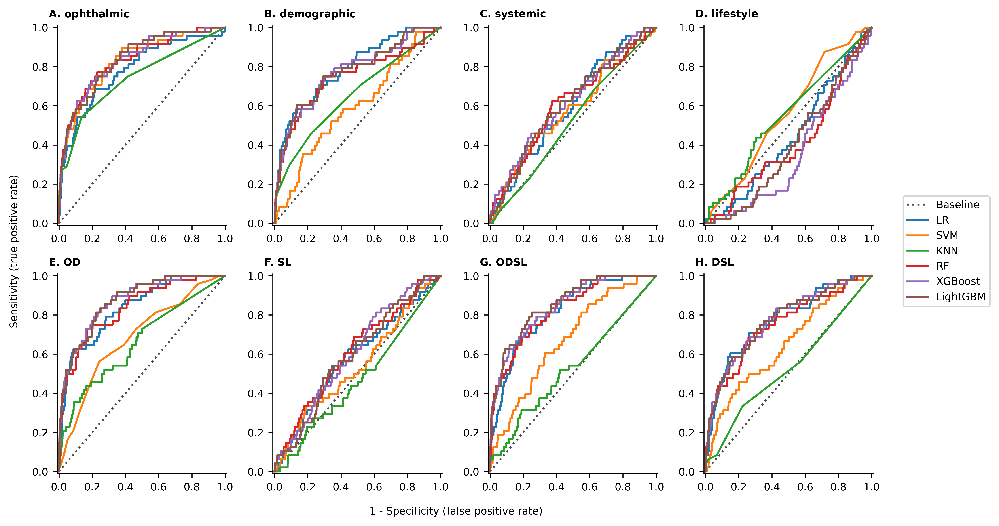

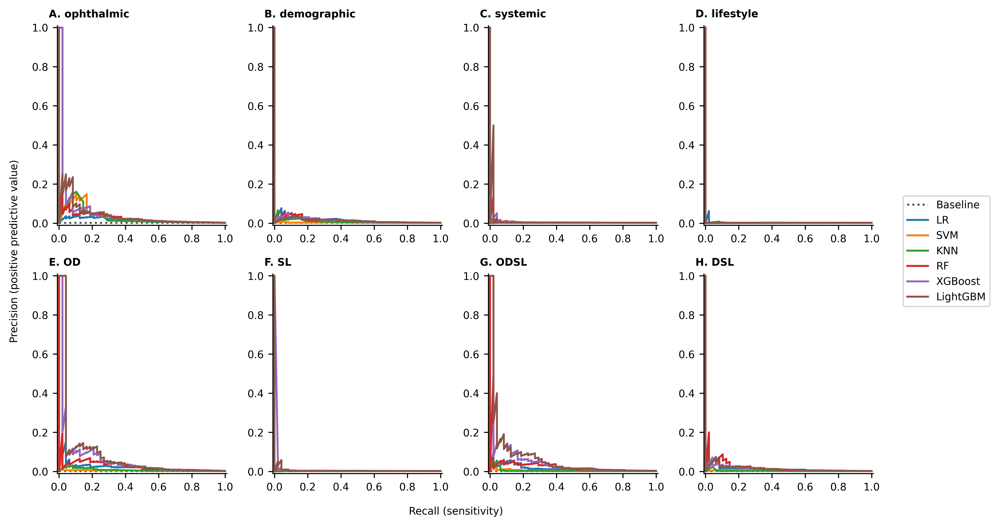

In [7]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)


auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_3year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_3year_tte,
        #y_test_3year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_3year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_noIOPrnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_3year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_noIOPrnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_noIOPrnfl3year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()